In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
os.environ['CDF_LIB'] = '/home/peijin/cdf/cdf38_0-dist/lib'

import requests
import datetime
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.dates import DateFormatter
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import matplotlib.dates as mdates
from matplotlib.ticker import ScalarFormatter

from aiapy.calibrate import normalize_exposure, register, update_pointing
from astropy import units as u
from astropy.visualization import ImageNormalize, SqrtStretch, PercentileInterval

import sunpy.map
from sunpy import timeseries as ts
from sunpy.net import Fido, attrs as a

from scipy.ndimage import gaussian_filter
from solarmach import SolarMACH
import pyspedas
# from pytplot import tplot
# from pytplot import options
from pytplot import get_data
from spacepy import pycdf

mpl.rcParams['date.epoch'] = '1970-01-01T00:00:00'
try:
    mdates.set_epoch('1970-01-01T00:00:00')
except:
    pass

#plt.style.use('seaborn')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'

### Find the spotless days

https://www.sidc.be/SILSO/dayssnplot

In [3]:
df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')
df.head()

,year,month,day,total_sunspot_num,stdv,num_obs,provisional_indicator
0,1818,1,1,-1,-1.0,0,1
1,1818,1,2,-1,-1.0,0,1
2,1818,1,3,-1,-1.0,0,1
3,1818,1,4,-1,-1.0,0,1
4,1818,1,5,-1,-1.0,0,1


In [4]:
# Replace -1 with NaN
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan)

# Combine 'year', 'month', and 'day' columns into a single datetime column
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

# Drop the original 'year', 'month', and 'day' columns
df = df.drop(columns=['year', 'month', 'day'])
df.head()

,total_sunspot_num,stdv,num_obs,provisional_indicator,date
0,NaN,-1.0,0,1,1818-01-01
1,NaN,-1.0,0,1,1818-01-02
2,NaN,-1.0,0,1,1818-01-03
3,NaN,-1.0,0,1,1818-01-04
4,NaN,-1.0,0,1,1818-01-05


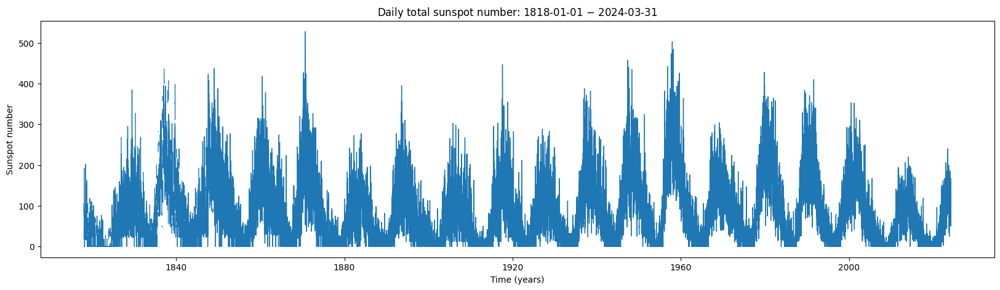

In [259]:
fig = plt.figure(figsize=[20,5])
ax = fig.add_subplot(111)
ax.plot(df['date'], df['total_sunspot_num'], lw=1)
#ax.fill_between(df['date'], df['total_sunspot_num']-df['stdv'], df['total_sunspot_num']+df['stdv'], color='lightgrey', alpha=0.5)
ax.set_xlabel('Time (years)')
ax.set_ylabel('Sunspot number')
ax.set_title(f"Daily total sunspot number: {df['date'][0].date()} $-$ {df['date'].iloc[-1].date()}")
plt.show()

In [5]:
# Filter the DataFrame to include only data from 2019 onwards
sub_df = df[df['date'] >= '2021-09-18']

In [7]:
# Filter the DataFrame to find the days where the sunspot number was zero
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]
list_spotless_days = [str(t.date()) for t in zero_sunspot_days['date']]
print(len(zero_sunspot_days))

day_index = 0
print(zero_sunspot_days['date'].iloc[day_index])

5
2021-09-18 00:00:00


### Check the solar disk during the spotless day

In [7]:
result = Fido.search(a.Time(f"{zero_sunspot_days['date'].iloc[day_index]}",
                            f"{zero_sunspot_days['date'].iloc[day_index] + datetime.timedelta(minutes=1)}"),
                     a.Instrument('AIA'),
                     a.Wavelength(193*u.angstrom),
                     a.Sample(1*u.min))
display(result)
aia_file = Fido.fetch(result[0], path='./{instrument}/{file}')

Start Time,End Time,Source,Instrument,Wavelength [2],Provider,Physobs,Wavetype,Extent Width,Extent Length,Extent Type,Size
,,,,Angstrom,,,,,,,Mibyte
object,object,str3,str3,float64,str4,str9,str6,str4,str4,str8,float64
2021-05-03 00:00:04.000,2021-05-03 00:00:05.000,SDO,AIA,193.0 .. 193.0,JSOC,intensity,NARROW,4096,4096,FULLDISK,64.64844


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

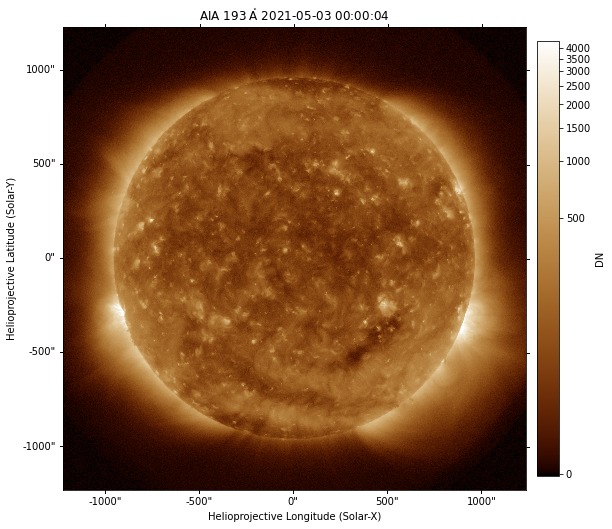

In [8]:
m = sunpy.map.Map(aia_file)
# m.plot_settings['norm'] = ImageNormalize(vmin=0,
#                                          vmax=3e3,
#                                          stretch=SqrtStretch())
fig = plt.figure(figsize=[10,10])
ax = fig.add_subplot(111, projection=m)

# clip out pixels with extreme values. Here, we clip out the darkest 1% of pixels and the brightest 0.01% of pixels.
aia_map = m.plot(axes=ax, clip_interval=(1, 99.99)*u.percent)
ax.grid(False)
fig.colorbar(aia_map, shrink=0.8, pad=0.02, label=m.meta['pixlunit'])
plt.show()

### Check the s/c locations

In [ ]:
body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP', 'Solo']
vsw_list = [] # [400, 400, 400, 400, 400] # leave empty to obtain measurements
date = str(zero_sunspot_days['date'].iloc[day_index])

coord_sys = 'Stonyhurst'                         # 'Carrington' (default) or 'Stonyhurst'
reference_long = None                              # longitude of reference (None to omit)
reference_lat = None                               # latitude of reference (None to omit)
reference_vsw = 400                              # define solar wind speed at reference
long_offset = 270                                # longitudinal offset for polar plot; defines where Earth's longitude is (by default 270, i.e., at "6 o'clock")
plot_spirals = True                              # plot Parker spirals for each body
plot_sun_body_line = False                       # plot straight line between Sun and body
return_plot_object = True                        # figure and axis object of matplotib are returned, allowing further adjustments to the figure
transparent = True                              # make output figure background transparent
numbered_markers = True                          # plot each body with a numbered marker

# initialize
sm = SolarMACH(date, body_list, vsw_list, reference_long, reference_lat, coord_sys)

# make plot
fig_solmach, ax_solmach = sm.plot(plot_spirals=plot_spirals,
                  plot_sun_body_line=plot_sun_body_line,
                  reference_vsw=reference_vsw,
                  transparent=transparent,
                  numbered_markers=numbered_markers,
                  long_offset=long_offset,
                  return_plot_object=return_plot_object,
                                  figsize=[17,10]
                                 )
# # remove the second small legend
# for i, obj in enumerate(ax_solmach.get_children()):
#     if isinstance(obj, matplotlib.legend.Legend):
#         obj.remove()

# # remove the numbers on the bodies
# for i, obj in enumerate(ax_solmach.get_children()):
#     if isinstance(obj, matplotlib.text.Annotation):
#         text_element = obj.get_text()
#         if text_element=='1' or text_element=='2' or text_element=='3' or text_element=='4' or text_element=='5':
#             obj.remove()

df_solmach = sm.coord_table
display(df_solmach)

### Check X-rays from GOES

In [29]:
goes_result = Fido.search(a.Time(f"{zero_sunspot_days['date'].iloc[day_index].date()}",
                                 f"{zero_sunspot_days['date'].iloc[day_index].date()}"),
                                 a.Instrument('XRS'), a.goes.SatelliteNumber(16))
goes_file = Fido.fetch(goes_result, path='./{instrument}/{file}')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

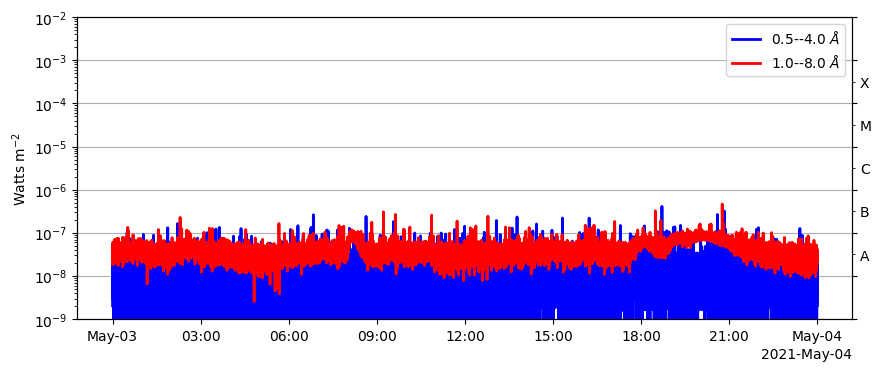

In [30]:
goes = ts.TimeSeries(goes_file)

fig = plt.figure(figsize=[10,4])
ax = fig.add_subplot(111)
goes.plot(axes=ax)
plt.show()

In [8]:
RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
df_RAD1_int = pd.DataFrame(RAD1_int).T
RAD1_dB = 10*np.log10(df_RAD1_int)
RAD1_dB.replace([np.inf, -np.inf], np.nan, inplace=True)

# mean subtraction
df_windRAD1_mean = RAD1_dB.mean(axis=1)
df_windRAD1 = RAD1_dB.sub(df_windRAD1_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windRAD1)
max_val = np.max(df_windRAD1)
df_windRAD1_norm = (df_windRAD1 - min_val) / (max_val - min_val)

wind_rad1_norm = ImageNormalize(df_windRAD1_norm, interval=PercentileInterval(90))
# =====================================================================================

RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
df_RAD2_int = pd.DataFrame(RAD2_int).T
RAD2_dB = 10*np.log10(df_RAD2_int)
RAD2_dB.replace([np.inf, -np.inf], np.nan, inplace=True)

# mean subtraction
df_windRAD2_mean = RAD2_dB.mean(axis=1)
df_windRAD2 = RAD2_dB.sub(df_windRAD2_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windRAD2)
max_val = np.max(df_windRAD2)
df_windRAD2_norm = (df_windRAD2 - min_val) / (max_val - min_val)

wind_rad2_norm = ImageNormalize(df_windRAD2_norm, interval=PercentileInterval(90))
# =====================================================================================

TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

# mean subtraction
df_windTNR = pd.DataFrame(TNR_int.T)
df_windTNR_mean = df_windTNR.mean(axis=1)
df_windTNR = df_windTNR.sub(df_windTNR_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windTNR)
max_val = np.max(df_windTNR)
df_windTNR_norm = (df_windTNR - min_val) / (max_val - min_val)

wind_TNR_norm = ImageNormalize(df_windTNR_norm, interval=PercentileInterval(90))
# =====================================================================================

fig = plt.figure(figsize=[20,7])

ax = fig.add_subplot(311)
spect_rad1 = ax.pcolormesh(t_sta, RAD1_freq/1e3,
                           df_windRAD1_norm,
                           norm=wind_rad1_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad1, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD1: {RAD1_freq[0]:.2f} kHz $-$ {RAD1_freq[-1]/1e3:.2f} MHz')

ax = fig.add_subplot(312)
spect_rad2 = ax.pcolormesh(t_sta, RAD2_freq/1e3,
                           df_windRAD2_norm,
                           norm=wind_rad2_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad2, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD2: {RAD2_freq[0]/1e3:.2f} MHz $-$ {RAD2_freq[-1]/1e3:.2f} MHz')

ax = fig.add_subplot(313)
spect_TNR = ax.pcolormesh(t_sta, TNR_freq/1e3,
                           df_windTNR_norm,
                           norm=wind_TNR_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_TNR, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_TNR: {TNR_freq[0]:.2f} kHz $-$ {TNR_freq[-1]:.2f} kHz')

fig.tight_layout()
plt.show()

25-Apr-24 21:43:28: The name E_VOLTAGE_RAD1 is currently not in pytplot


TypeError: cannot unpack non-iterable NoneType object

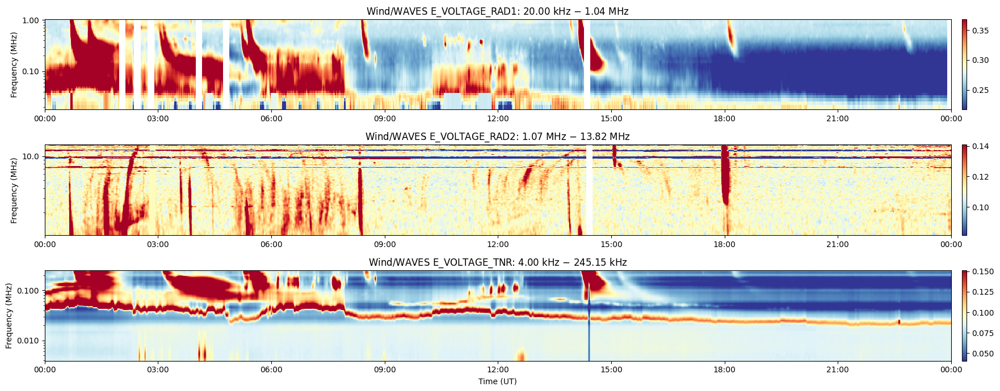

In [489]:
#  calibrate the flux unit
wind = pycdf.CDF(f'/home/mnedal/DIAS/wind_data/waves/wav_h1/{year}/wi_h1_wav_{year}{month}{day}_v01.cdf')
wind_time = np.array(wind.get('Epoch'))
RAD1_freq = np.array(wind.get('Frequency_RAD1'))
RAD2_freq = np.array(wind.get('Frequency_RAD2'))
TNR_freq = np.array(wind.get('Frequency_TNR'))
RAD1_int = np.array(wind.get('E_VOLTAGE_RAD1'))
RAD2_int = np.array(wind.get('E_VOLTAGE_RAD2'))
TNR_int = np.array(wind.get('E_VOLTAGE_TNR'))

bandwidth_RAD1 = 3 # kHz
sensitivity_RAD1 = 7*10**-9 # nV/sqrt(Hz)
voltage_RAD1 = sensitivity_RAD1 * np.sqrt(RAD1_int.T)
power_RAD1 = voltage_RAD1**2 * bandwidth_RAD1
RAD1_dB = 10*np.log10(power_RAD1)
RAD1_dB = pd.DataFrame(RAD1_dB)
RAD1_dB.replace([np.inf, -np.inf], np.nan, inplace=True)

# mean subtraction
df_windRAD1_mean = RAD1_dB.mean(axis=1)
df_windRAD1 = RAD1_dB.sub(df_windRAD1_mean, axis=0)

# Apply Gaussian smoothing
df_windRAD1 = gaussian_filter(df_windRAD1, sigma=1)

# drop columns with NaNs
df_windRAD1 = pd.DataFrame(df_windRAD1)
# df_windRAD1.dropna(axis=1, inplace=True)
# Fill NaN values with median of the column
df_windRAD1.fillna(df_windRAD1.median(), inplace=True)

# Min-Max normalization
min_val = np.min(df_windRAD1)
max_val = np.max(df_windRAD1)
df_windRAD1_norm = (df_windRAD1 - min_val) / (max_val - min_val)

wind_rad1_norm = ImageNormalize(df_windRAD1_norm, interval=PercentileInterval(90))
# =====================================================================================

df_RAD2_int = pd.DataFrame(RAD2_int).T

bandwidth_RAD2 = 20 # kHz
sensitivity_RAD2 = 7*10**-9 # nV/sqrt(Hz)
voltage_RAD2 = sensitivity_RAD2 * np.sqrt(RAD2_int.T)
power_RAD2 = voltage_RAD2**2 * bandwidth_RAD2
RAD2_dB = 10*np.log10(power_RAD2)
RAD2_dB = pd.DataFrame(RAD2_dB)
RAD2_dB.replace([np.inf, -np.inf], np.nan, inplace=True)

# mean subtraction
df_windRAD2_mean = RAD2_dB.mean(axis=1)
df_windRAD2 = RAD2_dB.sub(df_windRAD2_mean, axis=0)

# Apply Gaussian smoothing
df_windRAD2 = gaussian_filter(df_windRAD2, sigma=1)

# drop columns with NaNs
df_windRAD2 = pd.DataFrame(df_windRAD2)
# df_windRAD2.dropna(axis=1, inplace=True)
# Fill NaN values with median of the column
df_windRAD2.fillna(df_windRAD2.median(), inplace=True)

# Min-Max normalization
min_val = np.min(df_windRAD2)
max_val = np.max(df_windRAD2)
df_windRAD2_norm = (df_windRAD2 - min_val) / (max_val - min_val)

wind_rad2_norm = ImageNormalize(df_windRAD2_norm, interval=PercentileInterval(90))
# =====================================================================================

# mean subtraction
df_windTNR = pd.DataFrame(TNR_int.T)
df_windTNR_mean = df_windTNR.mean(axis=1)
df_windTNR = df_windTNR.sub(df_windTNR_mean, axis=0)

# Apply Gaussian smoothing
df_windTNR = gaussian_filter(df_windTNR, sigma=1)

# drop columns with NaNs
df_windTNR = pd.DataFrame(df_windTNR)
# df_windTNR.dropna(axis=1, inplace=True)
# Fill NaN values with median of the column
df_windTNR.fillna(df_windTNR.median(), inplace=True)

# Min-Max normalization
min_val = np.min(df_windTNR)
max_val = np.max(df_windTNR)
df_windTNR_norm = (df_windTNR - min_val) / (max_val - min_val)

wind_TNR_norm = ImageNormalize(df_windTNR_norm, interval=PercentileInterval(90))
# =====================================================================================

fig = plt.figure(figsize=[20,7])

ax = fig.add_subplot(311)
spect_rad1 = ax.pcolormesh(wind_time, RAD1_freq/1e3,
                           df_windRAD1_norm,
                           norm=wind_rad1_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad1, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD1: {RAD1_freq[0]:.2f} kHz $-$ {RAD1_freq[-1]/1e3:.2f} MHz')

ax = fig.add_subplot(312)
spect_rad2 = ax.pcolormesh(wind_time, RAD2_freq/1e3,
                           df_windRAD2_norm,
                           norm=wind_rad2_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad2, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD2: {RAD2_freq[0]/1e3:.2f} MHz $-$ {RAD2_freq[-1]/1e3:.2f} MHz')

ax = fig.add_subplot(313)
spect_TNR = ax.pcolormesh(wind_time, TNR_freq/1e3,
                           df_windTNR_norm,
                           norm=wind_TNR_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_TNR, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_TNR: {TNR_freq[0]:.2f} kHz $-$ {TNR_freq[-1]:.2f} kHz')
# ax.set_xlim(left=pd.Timestamp(f"{wind_time[0].date()} 17:00"), right=pd.Timestamp(f"{wind_time[0].date()} 19:00"))

fig.tight_layout()
plt.show()

In [10]:
def minmax_normalize(arr=None):
    '''
    Min-Max normalization.
    '''
    min_val = np.min(arr)
    max_val = np.max(arr)
    arr_norm = (arr - min_val) / (max_val - min_val)
    return arr_norm

In [ ]:
# WIND

time_range = [f"{zero_sunspot_days['date'].iloc[day_index].date()}",
              f"{zero_sunspot_days['date'].iloc[day_index].date() + datetime.timedelta(days=1)}"]
wind_vars = pyspedas.wind.waves(trange=time_range)

RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

# Normalize each receiver independantly
# RAD1_int_norm = minmax_normalize(arr=RAD1_int)
# RAD2_int_norm = minmax_normalize(arr=RAD2_int)
# TNR_int_norm = minmax_normalize(arr=TNR_int)

# wind_data = np.concatenate((TNR_int_norm, RAD2_int_norm, RAD1_int_norm), axis=1)
wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

# calculate the mean value in each row (freq channel)
# and subtract it from each corresponding row
# df_wind = pd.DataFrame(wind_data.T)
# df_wind_mean = df_wind.mean(axis=1)
# df_wind = df_wind.sub(df_wind_mean, axis=0)

# rescale the data
wind_norm = minmax_normalize(arr=wind_data.T)

# Apply Gaussian smoothing
smoothed_wind = gaussian_filter(wind_norm, sigma=1)

wind_norm = ImageNormalize(smoothed_wind, interval=PercentileInterval(90))

t_sta = [mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(t), '%Y-%m-%d %H:%M:%S.%f')) for t in TNR_times]

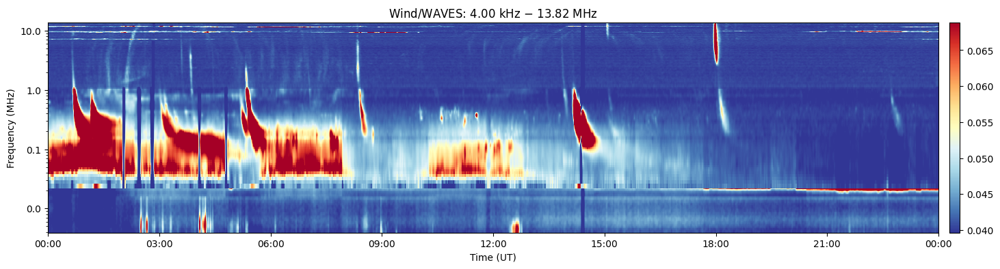

In [26]:
fig = plt.figure(figsize=[20,4])
ax = plt.gca()
spect = ax.pcolormesh(t_sta, wind_freq/1e3, smoothed_wind, norm=wind_norm, cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

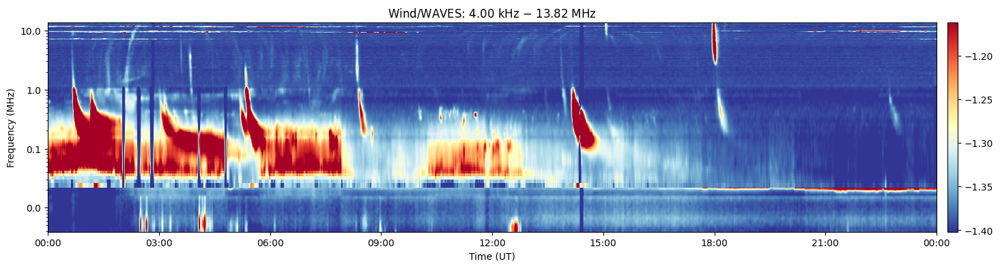

In [27]:
fig = plt.figure(figsize=[20,4])
ax = plt.gca()
spect = ax.pcolormesh(t_sta, wind_freq/1e3, np.log10(smoothed_wind),
                        vmin=np.percentile(np.log10(smoothed_wind), 5),
                        vmax=np.percentile(np.log10(smoothed_wind), 95),
                      cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

### Check the radio dynamic spectra

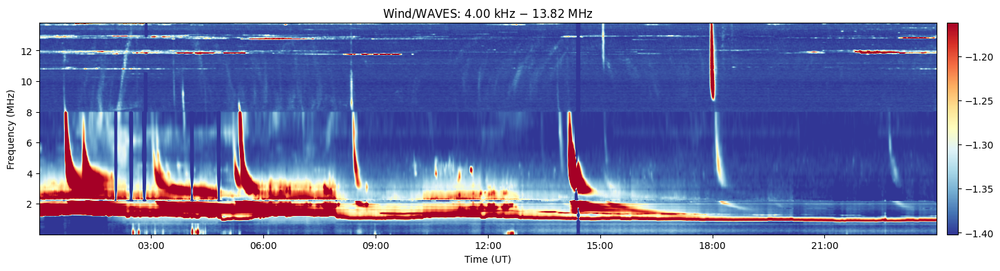

In [24]:
fig = plt.figure(figsize=[20,4])
ax = plt.gca()
spect = ax.imshow(np.log10(smoothed_wind),
                  aspect='auto', origin='lower',
                  extent=[t_sta[0], t_sta[-1], wind_freq[0]/1e3, wind_freq[-1]/1e3],
                vmin=np.percentile(np.log10(smoothed_wind), 5),
                vmax=np.percentile(np.log10(smoothed_wind), 95),
                  cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

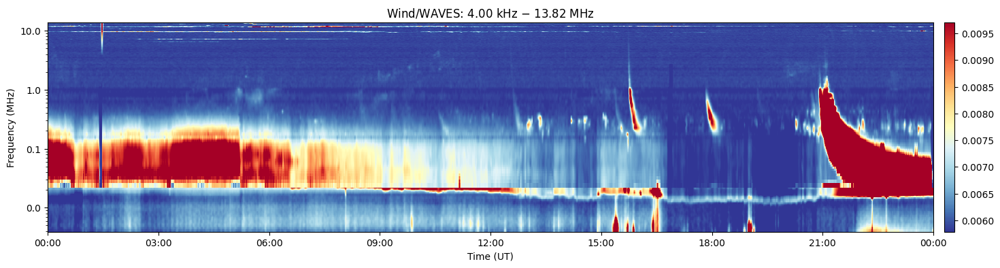

In [527]:
# log scale
fig = plt.figure(figsize=[20,4])
ax = plt.gca()
spect = ax.pcolormesh(t_sta, wind_freq/1e3, smoothed_wind, norm=wind_norm, cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

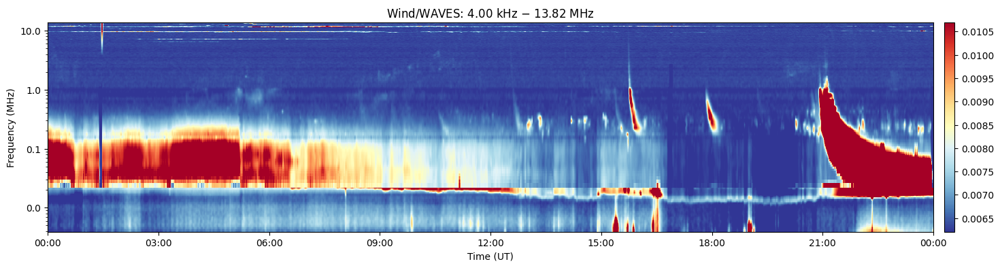

In [431]:
# normalize spect
min_val = np.min(smoothed_wind)
max_val = np.max(smoothed_wind)
smoothed_wind_norm = (smoothed_wind - min_val) / (max_val - min_val)
wind_norm = ImageNormalize(smoothed_wind_norm, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,4])
ax = plt.gca()
spect_wind = ax.pcolormesh(t_sta, wind_freq/1e3, smoothed_wind_norm, norm=wind_norm, cmap='RdYlBu_r')
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.colorbar(spect_wind, pad=0.01)
plt.show()

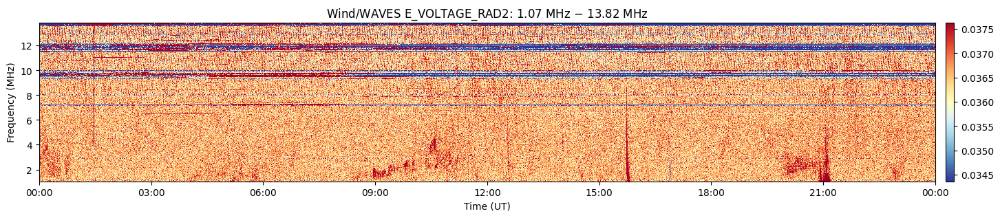

In [336]:
RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')

# mean subtraction
df_windRAD2 = pd.DataFrame(RAD2_int.T)
df_windRAD2_mean = df_windRAD2.mean(axis=1)
df_windRAD2 = df_windRAD2.sub(df_windRAD2_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windRAD2)
max_val = np.max(df_windRAD2)
df_windRAD2_norm = (df_windRAD2 - min_val) / (max_val - min_val)

wind_rad2_norm = ImageNormalize(df_windRAD2_norm, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,3])
ax = plt.gca()
spect_rad2 = ax.pcolormesh(t_sta, RAD2_freq/1e3,
                           df_windRAD2_norm,
                           norm=wind_rad2_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad2, pad=0.01)
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD2: {RAD2_freq[0]/1e3:.2f} MHz $-$ {RAD2_freq[-1]/1e3:.2f} MHz')
plt.show()

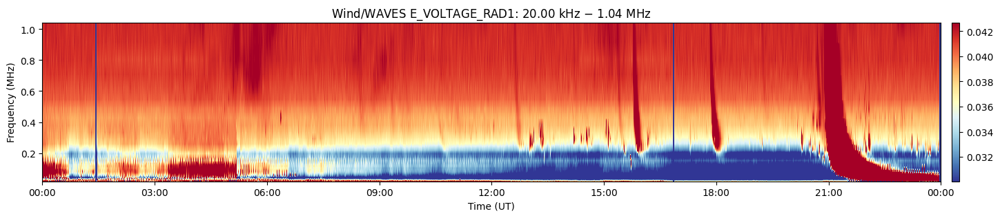

In [335]:
RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')

# mean subtraction
df_windRAD1 = pd.DataFrame(RAD1_int.T)
df_windRAD1_mean = df_windRAD1.mean(axis=1)
df_windRAD1 = df_windRAD1.sub(df_windRAD1_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windRAD1)
max_val = np.max(df_windRAD1)
df_windRAD1_norm = (df_windRAD1 - min_val) / (max_val - min_val)

wind_rad1_norm = ImageNormalize(df_windRAD1_norm, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,3])
ax = plt.gca()
spect_rad1 = ax.pcolormesh(t_sta, RAD1_freq/1e3,
                           df_windRAD1_norm,
                           norm=wind_rad1_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_rad1, pad=0.01)
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_RAD1: {RAD1_freq[0]:.2f} kHz $-$ {RAD1_freq[-1]/1e3:.2f} MHz')
plt.show()

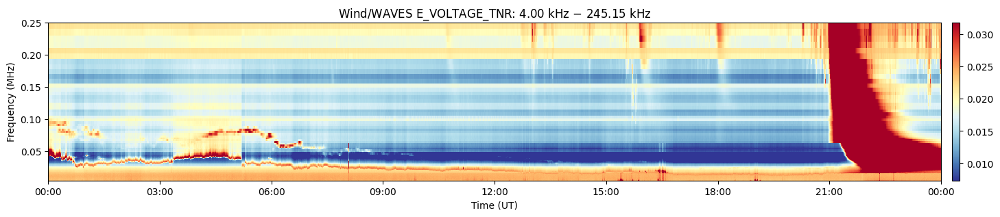

In [334]:
TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

# mean subtraction
df_windTNR = pd.DataFrame(TNR_int.T)
df_windTNR_mean = df_windTNR.mean(axis=1)
df_windTNR = df_windTNR.sub(df_windTNR_mean, axis=0)

# Min-Max normalization
min_val = np.min(df_windTNR)
max_val = np.max(df_windTNR)
df_windTNR_norm = (df_windTNR - min_val) / (max_val - min_val)

wind_TNR_norm = ImageNormalize(df_windTNR_norm, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,3])
ax = plt.gca()
spect_TNR = ax.pcolormesh(t_sta, TNR_freq/1e3,
                           df_windTNR_norm,
                           norm=wind_TNR_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect_TNR, pad=0.01)
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES E_VOLTAGE_TNR: {TNR_freq[0]:.2f} kHz $-$ {TNR_freq[-1]:.2f} kHz')
plt.show()

In [345]:
df_windTNR_norm.shape, df_windRAD1_norm.shape, df_windRAD2_norm.shape

((96, 1440), (256, 1440), (256, 1440))

In [350]:
results = Fido.search(a.Time('2021/09/01', '2021/09/21'),
                      a.Instrument('ILOFAR'))
ilofar_file = Fido.fetch(result[0], path='./{instrument}/{file}')

Start Time,End Time,Instrument,Source,Provider,Polarisation
Time,Time,str6,str6,str6,str1
2021-09-14 07:39:13.000,2021-09-14 07:39:13.999,ILOFAR,ILOFAR,ILOFAR,X
2021-09-14 07:39:13.000,2021-09-14 07:39:13.999,ILOFAR,ILOFAR,ILOFAR,Y
2021-09-01 08:07:29.000,2021-09-01 08:07:29.999,ILOFAR,ILOFAR,ILOFAR,X
2021-09-01 08:07:29.000,2021-09-01 08:07:29.999,ILOFAR,ILOFAR,ILOFAR,Y
2021-09-07 08:07:52.000,2021-09-07 08:07:52.999,ILOFAR,ILOFAR,ILOFAR,X
2021-09-07 08:07:52.000,2021-09-07 08:07:52.999,ILOFAR,ILOFAR,ILOFAR,Y
2021-09-08 08:04:07.000,2021-09-08 08:04:07.999,ILOFAR,ILOFAR,ILOFAR,X
2021-09-08 08:04:07.000,2021-09-08 08:04:07.999,ILOFAR,ILOFAR,ILOFAR,Y
2021-09-08 10:34:31.000,2021-09-08 10:34:31.999,ILOFAR,ILOFAR,ILOFAR,X


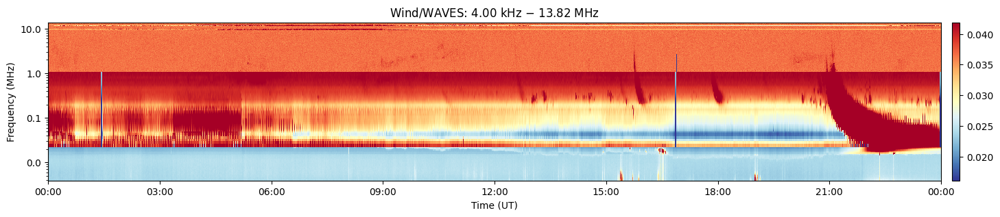

In [347]:
wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
wind_data = np.concatenate((df_windTNR_norm.values, df_windRAD1_norm.values, df_windRAD2_norm.values), axis=0)

wind_norm = ImageNormalize(wind_data, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,3])
ax = plt.gca()
spect = ax.pcolormesh(t_sta, wind_freq/1e3,
                           wind_data,
                           norm=wind_norm,
                           cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
ax.set_yscale('log')
ax.yaxis.set_major_formatter(ScalarFormatter())
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

12-Apr-24 13:38:40: File is current: wind_data/wind_masters/wi_h1_wav_00000000_v01.cdf
12-Apr-24 13:38:40: Downloading remote index: https://spdf.gsfc.nasa.gov/pub/data/wind/waves/wav_h1/2021/
12-Apr-24 13:38:41: File is current: wind_data/waves/wav_h1/2021/wi_h1_wav_20210503_v01.cdf
12-Apr-24 13:38:41: Using new version of cdflib (1.2.6)


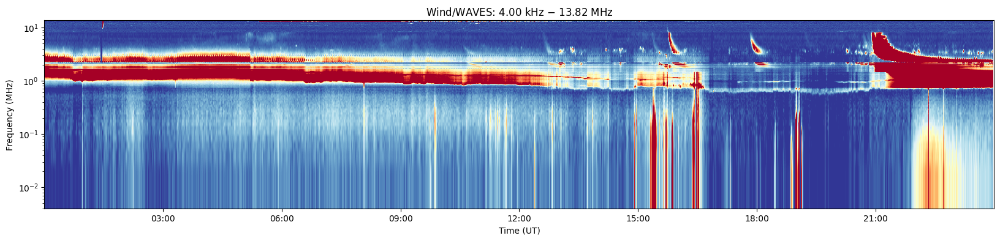

In [283]:
# WIND

time_range = [f"{zero_sunspot_days['date'].iloc[day_index].date()}",
              f"{zero_sunspot_days['date'].iloc[day_index].date() + datetime.timedelta(days=1)}"]
wind_vars = pyspedas.wind.waves(trange=time_range)

RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

wind_norm = ImageNormalize(wind_data, interval=PercentileInterval(90))

fig = plt.figure(figsize=[20,4])
ax = plt.gca()
ax.imshow(wind_data.T, aspect='auto', origin='lower', norm=wind_norm,
               extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')), 
                       mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                       wind_freq[0]/1e3, wind_freq[-1]/1e3], cmap='RdYlBu_r') # RdYlBu_r, RdYlGn_r, Spectral_r
ax.set_yscale('log')
ax.grid(False)
ax.xaxis_date()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlabel('Time (UT)')
ax.set_ylabel('Frequency (MHz)')
ax.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')
plt.show()

In [268]:
datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f'),\
datetime.datetime.strptime(pyspedas.time_string(TNR_times)[1], '%Y-%m-%d %H:%M:%S.%f')

(datetime.datetime(2021, 5, 3, 0, 0, 30),
 datetime.datetime(2021, 5, 3, 0, 1, 30))

In [269]:
datetime.datetime.strptime(pyspedas.time_string(TNR_times)[1], '%Y-%m-%d %H:%M:%S.%f') - datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')

datetime.timedelta(seconds=60)

In [28]:
# STEREO

# get the data file
YEAR = zero_sunspot_days['date'].iloc[day_index].date().year
MONTH = zero_sunspot_days['date'].iloc[day_index].date().month
DAY = zero_sunspot_days['date'].iloc[day_index].date().day

if DAY < 9:
    DAY = f'0{DAY}'
else:
    DAY = f'{DAY}'

if MONTH < 9:
    MONTH = f'0{MONTH}'
else:
    MONTH = f'{MONTH}'

URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{YEAR}/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'
response = requests.get(URL)
open(os.path.join('./stereo_data', f'stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

# read the data values
cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf')
time_ste = np.array(cdf_stereo.get('Epoch'))
freq_ste = np.array(cdf_stereo.get('frequency'))
data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

# subtract the Mean value
# calculate the mean intensity in each row (freq channel)
df_ste_A = pd.DataFrame(data_ste_A.T)
df_ste_mean = df_ste_A.mean(axis=1)

# subtract that mean value from each corresponding row
data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

# Apply Gaussian smoothing
smoothed_ste_A = gaussian_filter(df_ste_A, sigma=1)

sta_norm = ImageNormalize(smoothed_ste_A, interval=PercentileInterval(97), clip=True)

CDFError: NOT_A_CDF_OR_NOT_SUPPORTED: Named CDF is corrupted or not supported by the current library version.

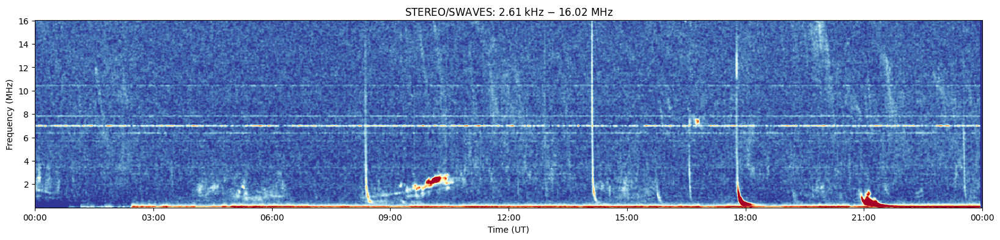

In [512]:
plt.figure(figsize=[20,4])
# plt.imshow(data_ste_A, aspect='auto', origin='lower', norm=sta_norm,
#             extent=[mdates.date2num(time_ste[0]), mdates.date2num(time_ste[-1]), 
#                     freq_ste[0]/1e3, freq_ste[-1]/1e3],
#             cmap='RdYlBu_r')
plt.pcolormesh(time_ste, freq_ste/1e3,
               smoothed_ste_A,
               norm=sta_norm,
               cmap='RdYlBu_r')
# plt.yscale('log')
plt.grid(False)
plt.xlabel('Time (UT)')
plt.ylabel('Frequency (MHz)')
plt.title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
# plt.xlim(left=pd.Timestamp(f'{time_ste[0].date()} 08:00'), right=pd.Timestamp(f'{time_ste[0].date()} 12:00'))
plt.show()

In [29]:
# PSP

# HFR
URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'
response = requests.get(URL)
open(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

# LFR
URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'
response = requests.get(URL)
open(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

275

In [31]:
# load the PSP data
cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'))
cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'))

tmin_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMIN']
tmax_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMAX']

# convert pixels values to dB, z-axis
arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))

# the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold according to Pulupa et al. 2020, https://doi.org/10.3847/1538-4365/ab5dc0 
# more info: https://en.wikipedia.org/wiki/Decibel
Lp_lfr = 10*np.log10(arr_lfr/10**-16)

# x-axis
tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr'))
# y-axis
freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6

tmin_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMIN']
tmax_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMAX']

# convert pixels values to dB, z-axis
arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
Lp_hfr = 10*np.log10(arr_hfr/10**-16)

# x-axis
tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr'))
# y-axis
freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6

# clean the dyspec by subtracting the Mean intensity from each freq channel
df_psp_hfr = pd.DataFrame(Lp_hfr.T)
df_psp_lfr = pd.DataFrame(Lp_lfr.T)

df_psp_hfr_mean = df_psp_hfr.mean(axis=1)
df_psp_lfr_mean = df_psp_lfr.mean(axis=1)

# subtract that mean value from each corresponding row
df_psp_hfr = df_psp_hfr.sub(df_psp_hfr_mean, axis=0)
df_psp_lfr = df_psp_lfr.sub(df_psp_hfr_mean, axis=0)

# concat the two arrays of both bands
df_lfr = pd.DataFrame(df_psp_lfr)
df_lfr.insert(loc=0, column='frequency', value=freq_lfr[1])
df_lfr.set_index(['frequency'], inplace=True)

df_hfr = pd.DataFrame(df_psp_hfr)
df_hfr.insert(loc=0, column='frequency', value=freq_hfr[1])
df_hfr.set_index(['frequency'], inplace=True)

# drop the overlapped rows, take only the first row of the duplicated group
df_psp = pd.concat([df_lfr, df_hfr])
df_psp = df_psp.sort_index(axis=0)
df_psp = df_psp[~df_psp.index.duplicated(keep='first')]
df_psp.columns = max([tm_lfr, tm_hfr], key=len)

psp_norm = ImageNormalize(df_psp.values, interval=PercentileInterval(97), clip=True)

CDFError: NOT_A_CDF_OR_NOT_SUPPORTED: Named CDF is corrupted or not supported by the current library version.

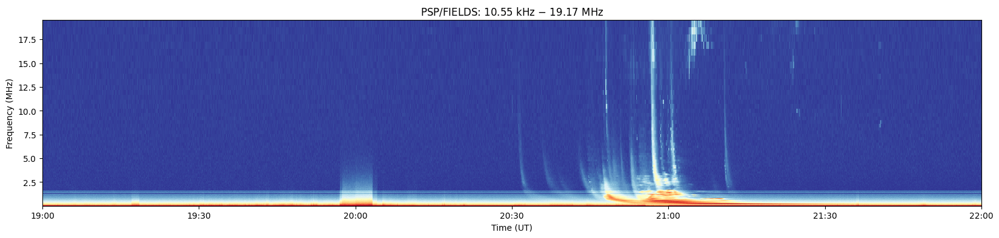

In [507]:
plt.figure(figsize=[20,4])
plt.pcolormesh(df_psp.columns, df_psp.index, df_psp.values, norm=psp_norm, cmap='RdYlBu_r')
plt.xlabel('Time (UT)')
plt.ylabel('Frequency (MHz)')
plt.title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.xlim(left=pd.Timestamp(f'{time_ste[0].date()} 19:00'), right=pd.Timestamp(f'{time_ste[0].date()} 22:00'))
plt.show()

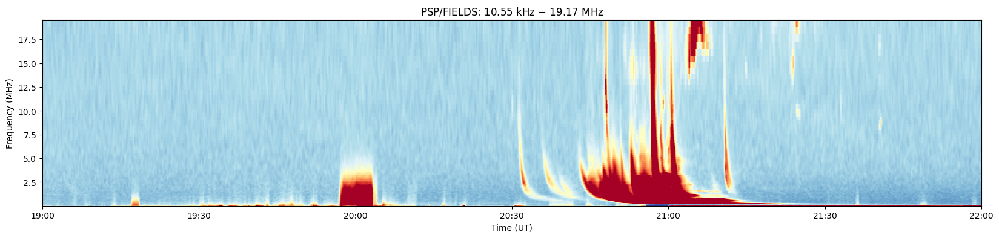

In [509]:
# calculate the mean value in each row (freq channel)
# and subtract it from each corresponding row
df_psp_mean = df_psp.mean(axis=1)
df_psp_submean = df_psp.sub(df_psp_mean, axis=0)

# Apply Gaussian smoothing
smoothed_psp = gaussian_filter(df_psp_submean.values, sigma=1)
df_smoothed_psp = pd.DataFrame(smoothed_psp, index=df_psp.index, columns=df_psp.columns)

psp_submean_norm = ImageNormalize(df_smoothed_psp, interval=PercentileInterval(97), clip=True)

plt.figure(figsize=[20,4])
plt.pcolormesh(tm_hfr, df_smoothed_psp.index, df_smoothed_psp.values, norm=psp_submean_norm, cmap='RdYlBu_r')
# plt.yscale('log')
plt.xlabel('Time (UT)')
plt.ylabel('Frequency (MHz)')
plt.title(f'PSP/FIELDS: {df_psp_submean.index[0]*1e3:.2f} kHz $-$ {df_psp_submean.index[-1]:.2f} MHz')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.xlim(left=pd.Timestamp(f'{time_ste[0].date()} 19:00'), right=pd.Timestamp(f'{time_ste[0].date()} 22:00'))
plt.show()

In [ ]:
fig = plt.figure(figsize=[20,7])
gs = GridSpec(3, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax1.pcolormesh(tm_hfr, df_psp.index, df_psp.values, norm=psp_norm, cmap='RdYlBu_r')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax2 = fig.add_subplot(gs[1, 0])
ax2.imshow(data_ste_A, aspect='auto', origin='lower', norm=sta_norm,
            extent=[mdates.date2num(time_ste[0]), mdates.date2num(time_ste[-1]), 
                    freq_ste[0]/1e3, freq_ste[-1]/1e3], cmap='RdYlBu_r')
ax2.grid(False)
ax2.set_ylabel('Frequency (MHz)')
ax2.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax3 = fig.add_subplot(gs[2, 0])
ax3.imshow(wind_data.T, aspect='auto', origin='lower', norm=wind_norm,
               extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')), 
                       mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                       wind_freq[0]/1e3, wind_freq[-1]/1e3], cmap='RdYlBu_r') # RdYlBu_r, RdYlGn_r, Spectral_r
ax3.grid(False)
ax3.xaxis_date()
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax3.set_xlabel('Time (UT)')
ax3.set_ylabel('Frequency (MHz)')
ax3.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')

ax4 = fig.add_subplot(gs[:, 1])
ax4.imshow(fig_solmach.canvas.renderer.buffer_rgba())
ax4.axes.xaxis.set_visible(False)
ax4.axes.yaxis.set_visible(False)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)
ax4.spines['bottom'].set_visible(False)
ax4.spines['left'].set_visible(False)

# handles, labels = fig_solmach.gca().get_legend_handles_labels()
# ax4.legend(handles, labels, bbox_to_anchor=[0.9, 0.95], markerscale=0.3, fontsize=7)

ax5 = fig.add_subplot(gs[:, 2], projection=m)
aia_map = m.plot(axes=ax5, clip_interval=(1, 99.99)*u.percent)
ax5.grid(False)
ax5.set_xlabel('Helioprojective Lonitude (Solar-X)')
ax5.set_ylabel('Helioprojective Latitude (Solar-Y)')

fig.tight_layout()
plt.show()

### Including XRS data

In [ ]:
fig = plt.figure(figsize=[20,10])
gs = GridSpec(4, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax1.pcolormesh(tm_hfr, df_psp.index, df_psp.values, norm=psp_norm, cmap='RdYlBu_r')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax2 = fig.add_subplot(gs[1, 0])
ax2.imshow(data_ste_A, aspect='auto', origin='lower', norm=sta_norm,
            extent=[mdates.date2num(time_ste[0]), mdates.date2num(time_ste[-1]), 
                    freq_ste[0]/1e3, freq_ste[-1]/1e3], cmap='RdYlBu_r')
ax2.grid(False)
ax2.set_ylabel('Frequency (MHz)')
ax2.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax3 = fig.add_subplot(gs[2, 0])
ax3.imshow(wind_data.T, aspect='auto', origin='lower', norm=wind_norm,
               extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')), 
                       mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                       wind_freq[0]/1e3, wind_freq[-1]/1e3], cmap='RdYlBu_r') # RdYlBu_r, RdYlGn_r, Spectral_r
ax3.grid(False)
ax3.xaxis_date()
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax3.set_ylabel('Frequency (MHz)')
ax3.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')

ax4 = fig.add_subplot(gs[3, 0])
goes.plot(axes=ax4)
ax4.set_xlabel('Time (UT)')
ax4.set_title(f'{goes.observatory}/{goes.source.upper()}')

ax5 = fig.add_subplot(gs[:, 1])
ax5.imshow(fig_solmach.canvas.renderer.buffer_rgba())
ax5.axes.xaxis.set_visible(False)
ax5.axes.yaxis.set_visible(False)
ax5.spines['top'].set_visible(False)
ax5.spines['right'].set_visible(False)
ax5.spines['bottom'].set_visible(False)
ax5.spines['left'].set_visible(False)

ax6 = fig.add_subplot(gs[:, 2], projection=m)
aia_map = m.plot(axes=ax6, clip_interval=(1, 99.99)*u.percent)
ax6.grid(False)
ax6.set_xlabel('Helioprojective Lonitude (Solar-X)')
ax6.set_ylabel('Helioprojective Latitude (Solar-Y)')

fig.tight_layout()
fig.savefig(f"./plots/summary_plot_{zero_sunspot_days['date'].iloc[day_index].date()}.png", format='png', bbox_inches='tight')
plt.show()

In [77]:
# # template
# fig = plt.figure(figsize=[20,7])

# gs = GridSpec(3, 3, fiure=fig)

# ax1 = fig.add_subplot(gs[0, 0])
# ax2 = fig.add_subplot(gs[1, 0])
# ax3 = fig.add_subplot(gs[2, 0])
# ax4 = fig.add_subplot(gs[:, 1])
# ax5 = fig.add_subplot(gs[:, 2])

# fig.tight_layout()
# plt.show()

In [ ]:
# download all AIA data
for t in zero_sunspot_days['date']:
    result = Fido.search(a.Time(t, t + datetime.timedelta(minutes=1)),
                     a.Instrument('AIA'),
                     a.Wavelength(193*u.angstrom),
                     a.Sample(1*u.min))
    aia_files = Fido.fetch(result[0], path='./{instrument}/{file}')

print('Done')

In [24]:
zero_sunspot_days['date'].tail()[:1]

74059   2020-10-07
Name: date, dtype: datetime64[ns]

### Doing a loop

In [ ]:
df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')                          # Import sunspot number data
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan) # Replace -1 with NaN
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
df = df.drop(columns=['year', 'month', 'day'])

sub_df = df[(df['date'] >= '2020-01-01') & (df['date'] <= '2020-12-31')] # Filter the DataFrame to include only data within a range
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]             # Filter the DataFrame to find the days where the sunspot number was zero

print(len(zero_sunspot_days))

for t in zero_sunspot_days['date'].tail():
    print(t)
    
    YEAR = t.date().year
    MONTH = t.date().month
    DAY = t.date().day
    
    if DAY < 9:
        DAY = f'0{DAY}'
    else:
        DAY = f'{DAY}'
    
    if MONTH < 9:
        MONTH = f'0{MONTH}'
    else:
        MONTH = f'{MONTH}'
    
#     try:
    #################################################################
    ######################### S/C locations #########################
    #################################################################

    body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP', 'Solo']
    vsw_list = [] # [400, 400, 400, 400, 400]        # leave empty to obtain measurements
    date_solmach = str(t)

    coord_sys = 'Stonyhurst'                         # 'Carrington' (default) or 'Stonyhurst'
    reference_long = None                            # longitude of reference (None to omit)
    reference_lat = None                             # latitude of reference (None to omit)
    reference_vsw = 400                              # define solar wind speed at reference
    long_offset = 270                                # longitudinal offset for polar plot; defines where Earth's longitude is (by default 270, i.e., at "6 o'clock")
    plot_spirals = True                              # plot Parker spirals for each body
    plot_sun_body_line = False                       # plot straight line between Sun and body
    return_plot_object = True                        # figure and axis object of matplotib are returned, allowing further adjustments to the figure
    transparent = True                               # make output figure background transparent
    numbered_markers = True                          # plot each body with a numbered marker

    # initialize
    sm = SolarMACH(date_solmach, body_list, vsw_list, reference_long, reference_lat, coord_sys)

    # make plot
    fig_solmach, ax_solmach = sm.plot(plot_spirals=plot_spirals,
                      plot_sun_body_line=plot_sun_body_line,
                      reference_vsw=reference_vsw,
                      transparent=transparent,
                      numbered_markers=numbered_markers,
                      long_offset=long_offset,
                      return_plot_object=return_plot_object,
                                      figsize=[17,10])

    #######################################################
    ######################### XRS #########################
    #######################################################

    goes_result = Fido.search(a.Time(t, t), a.Instrument('XRS'), a.goes.SatelliteNumber(16))
    goes_file = Fido.fetch(goes_result, path='./{instrument}/{file}')
    goes = ts.TimeSeries(goes_file)

    #######################################################
    ######################### AIA #########################
    #######################################################

    result = Fido.search(a.Time(t, t + datetime.timedelta(minutes=1)),
                         a.Instrument('AIA'),
                         a.Wavelength(193*u.angstrom),
                         a.Sample(1*u.min))
    aia_file = Fido.fetch(result[0], path='./{instrument}/{file}')
    m = sunpy.map.Map(aia_file)

    ########################################################
    ######################### WIND #########################
    ########################################################

    time_range = [f'{t.date()}', f'{t.date() + datetime.timedelta(days=1)}']
    wind_vars = pyspedas.wind.waves(trange=time_range)

    RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
    RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
    TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

    wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
    wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

    wind_norm = ImageNormalize(wind_data, interval=PercentileInterval(90))

    ########################################################
    ######################### STA ##########################
    ########################################################

    # get the data file
    URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{YEAR}/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'
    response = requests.get(URL)
    open(os.path.join('./stereo_data', f'stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

    # read the data values
    cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf')
    time_ste = np.array(cdf_stereo.get('Epoch'))
    freq_ste = np.array(cdf_stereo.get('frequency'))
    data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

    # subtract the Mean value
    # calculate the mean intensity in each row (freq channel)
    df_ste_A = pd.DataFrame(data_ste_A.T)
    df_ste_mean = df_ste_A.mean(axis=1)

    # subtract that mean value from each corresponding row
    data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

    sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(90))

    #######################################################
    ######################### PSP #########################
    #######################################################

    # HFR
    URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'
    response = requests.get(URL)
    open(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

    # LFR
    URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'
    response = requests.get(URL)
    open(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

    # load the PSP data
    cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'))
    cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'))

    tmin_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMIN']
    tmax_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMAX']

    tmin_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMIN']
    tmax_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMAX']

    # the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold
    # convert pixels values to dB
    arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))
    Lp_lfr = 10*np.log10(arr_lfr/10**-16) # z-axis
    tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr')) # x-axis
    freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

    # convert pixels values to dB
    arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
    Lp_hfr = 10*np.log10(arr_hfr/10**-16) # z-axis
    tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr')) # x-axis
    freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

    # clean the dyspec by subtracting the Mean intensity from each freq channel
    df_psp_hfr = pd.DataFrame(Lp_hfr.T)
    df_psp_lfr = pd.DataFrame(Lp_lfr.T)

    df_psp_hfr_mean = df_psp_hfr.mean(axis=1)
    df_psp_lfr_mean = df_psp_lfr.mean(axis=1)

    # subtract that mean value from each corresponding row
    df_psp_hfr = df_psp_hfr.sub(df_psp_hfr_mean, axis=0)
    df_psp_lfr = df_psp_lfr.sub(df_psp_hfr_mean, axis=0)

    # concat the two arrays of both bands
    df_lfr = pd.DataFrame(df_psp_lfr)
    df_lfr.insert(loc=0, column='frequency', value=freq_lfr[1])
    df_lfr.set_index(['frequency'], inplace=True)

    df_hfr = pd.DataFrame(df_psp_hfr)
    df_hfr.insert(loc=0, column='frequency', value=freq_hfr[1])
    df_hfr.set_index(['frequency'], inplace=True)

    # drop the overlapped rows, take only the first row of the duplicated group
    df_psp = pd.concat([df_lfr, df_hfr])
    df_psp = df_psp.sort_index(axis=0)
    df_psp = df_psp[~df_psp.index.duplicated(keep='first')]

    psp_norm = ImageNormalize(df_psp.values, interval=PercentileInterval(90))

    ############################################################
    ######################### BIG PLOT #########################
    ############################################################

    fig = plt.figure(figsize=[20,10])
    gs = GridSpec(4, 3, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.pcolormesh(tm_hfr, df_psp.index, df_psp.values, norm=psp_norm, cmap='RdYlBu_r')
    ax1.set_ylabel('Frequency (MHz)')
    ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax2 = fig.add_subplot(gs[1, 0])
    ax2.imshow(data_ste_A, aspect='auto', origin='lower', norm=sta_norm,
                extent=[mdates.date2num(time_ste[0]), mdates.date2num(time_ste[-1]), 
                        freq_ste[0]/1e3, freq_ste[-1]/1e3], cmap='RdYlBu_r')
    ax2.grid(False)
    ax2.set_ylabel('Frequency (MHz)')
    ax2.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax3 = fig.add_subplot(gs[2, 0])
    ax3.imshow(wind_data.T, aspect='auto', origin='lower', norm=wind_norm,
                   extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')), 
                           mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                           wind_freq[0]/1e3, wind_freq[-1]/1e3], cmap='RdYlBu_r') # RdYlBu_r, RdYlGn_r, Spectral_r
    ax3.grid(False)
    ax3.xaxis_date()
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax3.set_ylabel('Frequency (MHz)')
    ax3.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')

    ax4 = fig.add_subplot(gs[3, 0])
    goes.plot(axes=ax4)
    ax4.set_xlabel('Time (UT)')
    ax4.set_title(f'{goes.observatory}/{goes.source.upper()}')

    ax5 = fig.add_subplot(gs[:, 1])
    ax5.imshow(fig_solmach.canvas.renderer.buffer_rgba())
    ax5.axes.xaxis.set_visible(False)
    ax5.axes.yaxis.set_visible(False)
    ax5.spines['top'].set_visible(False)
    ax5.spines['right'].set_visible(False)
    ax5.spines['bottom'].set_visible(False)
    ax5.spines['left'].set_visible(False)

    ax6 = fig.add_subplot(gs[:, 2], projection=m)
    aia_map = m.plot(axes=ax6, clip_interval=(1, 99.99)*u.percent)
    ax6.grid(False)
    ax6.set_xlabel('Helioprojective Lonitude (Solar-X)')
    ax6.set_ylabel('Helioprojective Latitude (Solar-Y)')

    fig.tight_layout()
    fig.savefig(f'./plots/summary_plot_{t.date()}.png', format='png', bbox_inches='tight')
    plt.show()
    
#     except:
#         pass

In [81]:
1 + 1

2

In [ ]:
df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')                             # Import sunspot number data
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan)    # Replace -1 with NaN
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
df = df.drop(columns=['year', 'month', 'day'])

sub_df = df[(df['date'] >= '2020-01-01') & (df['date'] <= '2020-12-31')] # Filter the DataFrame to include only data within a range
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]             # Filter the DataFrame to find the days where the sunspot number was zero

data_dict = {
    'date': [],
    'wind_time': [],
    'wind_freq': [],
    'wind_spect': [],
    'wind_spectNorm': [],
    'stereo_time': [],
    'stereo_freq': [],
    'stereo_spect': [],
    'stereo_spectNorm': [],
    'psp_time': [],
    'psp_freq': [],
    'psp_spect': [],
    'psp_spectNorm': [],
    'locations': [],
    'aia_map': [],
    'goes_xrs': []
}

for t in zero_sunspot_days['date']:
    
    YEAR = t.date().year
    MONTH = t.date().month
    DAY = t.date().day
    
    if DAY < 9:
        DAY = f'0{DAY}'
    else:
        DAY = f'{DAY}'
    
    if MONTH < 9:
        MONTH = f'0{MONTH}'
    else:
        MONTH = f'{MONTH}'
    
    try:
        #################################################################
        ######################### S/C locations #########################
        #################################################################

        body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP', 'Solo']
        vsw_list = [] # [400, 400, 400, 400, 400]        # leave empty to obtain measurements
        date_solmach = str(t)

        coord_sys = 'Stonyhurst'                         # 'Carrington' (default) or 'Stonyhurst'
        reference_long = None                            # longitude of reference (None to omit)
        reference_lat = None                             # latitude of reference (None to omit)
        reference_vsw = 400                              # define solar wind speed at reference
        long_offset = 270                                # longitudinal offset for polar plot; defines where Earth's longitude is (by default 270, i.e., at "6 o'clock")
        plot_spirals = True                              # plot Parker spirals for each body
        plot_sun_body_line = False                       # plot straight line between Sun and body
        return_plot_object = True                        # figure and axis object of matplotib are returned, allowing further adjustments to the figure
        transparent = True                               # make output figure background transparent
        numbered_markers = True                          # plot each body with a numbered marker

        # initialize
        sm = SolarMACH(date_solmach, body_list, vsw_list, reference_long, reference_lat, coord_sys)

        # make plot
        fig_solmach, ax_solmach = sm.plot(plot_spirals=plot_spirals,
                          plot_sun_body_line=plot_sun_body_line,
                          reference_vsw=reference_vsw,
                          transparent=transparent,
                          numbered_markers=numbered_markers,
                          long_offset=long_offset,
                          return_plot_object=return_plot_object,
                                          figsize=[17,10]
                                         )
        
        #######################################################
        ######################### XRS #########################
        #######################################################
        
        goes_result = Fido.search(a.Time(f'{t.date()}', f'{t.date()}'), a.Instrument('XRS'), a.goes.SatelliteNumber(16))
        goes_file = Fido.fetch(goes_result, path='./{instrument}/{file}')
        goes = ts.TimeSeries(goes_file)
        
        #######################################################
        ######################### AIA #########################
        #######################################################

        result = Fido.search(a.Time(f'{t}', f'{t + datetime.timedelta(minutes=1)}'),
                             a.Instrument('AIA'),
                             a.Wavelength(193*u.angstrom),
                             a.Sample(1*u.min))
        aia_file = Fido.fetch(result[0], path='./{instrument}/{file}')
        m = sunpy.map.Map(aia_file)

        ########################################################
        ######################### WIND #########################
        ########################################################

        time_range = [f'{t.date()}', f'{t.date() + datetime.timedelta(days=1)}']
        wind_vars = pyspedas.wind.waves(trange=time_range)

        RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
        RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
        TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

        wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
        wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

        wind_norm = ImageNormalize(wind_data, interval=PercentileInterval(90))

        ########################################################
        ######################### STA ##########################
        ########################################################

        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{YEAR}/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./stereo_data', f'stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # read the data values
        cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf')
        time_ste = np.array(cdf_stereo.get('Epoch'))
        freq_ste = np.array(cdf_stereo.get('frequency'))
        data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

        # subtract the Mean value
        # calculate the mean intensity in each row (freq channel)
        df_ste_A = pd.DataFrame(data_ste_A.T)
        df_ste_mean = df_ste_A.mean(axis=1)

        # subtract that mean value from each corresponding row
        data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

        sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(90))

        #######################################################
        ######################### PSP #########################
        #######################################################

        # HFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # LFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # load the PSP data
        cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'))
        cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'))

        tmin_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMIN']
        tmax_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMAX']

        tmin_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMIN']
        tmax_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMAX']

        # the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold
        # convert pixels values to dB
        arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))
        Lp_lfr = 10*np.log10(arr_lfr/10**-16) # z-axis
        tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr')) # x-axis
        freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # convert pixels values to dB
        arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
        Lp_hfr = 10*np.log10(arr_hfr/10**-16) # z-axis
        tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr')) # x-axis
        freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # clean the dyspec by subtracting the Mean intensity from each freq channel
        df_psp_hfr = pd.DataFrame(Lp_hfr.T)
        df_psp_lfr = pd.DataFrame(Lp_lfr.T)

        df_psp_hfr_mean = df_psp_hfr.mean(axis=1)
        df_psp_lfr_mean = df_psp_lfr.mean(axis=1)

        # subtract that mean value from each corresponding row
        df_psp_hfr = df_psp_hfr.sub(df_psp_hfr_mean, axis=0)
        df_psp_lfr = df_psp_lfr.sub(df_psp_hfr_mean, axis=0)

        # concat the two arrays of both bands
        df_lfr = pd.DataFrame(df_psp_lfr)
        df_lfr.insert(loc=0, column='frequency', value=freq_lfr[1])
        df_lfr.set_index(['frequency'], inplace=True)

        df_hfr = pd.DataFrame(df_psp_hfr)
        df_hfr.insert(loc=0, column='frequency', value=freq_hfr[1])
        df_hfr.set_index(['frequency'], inplace=True)

        # drop the overlapped rows, take only the first row of the duplicated group
        df_psp = pd.concat([df_lfr, df_hfr])
        df_psp = df_psp.sort_index(axis=0)
        df_psp = df_psp[~df_psp.index.duplicated(keep='first')]

        psp_norm = ImageNormalize(df_psp.values, interval=PercentileInterval(90))

        # store the data in a dict object
        data_dict['date'].append(t)

        data_dict['wind_time'].append(TNR_times)
        data_dict['wind_freq'].append(wind_freq)
        data_dict['wind_spect'].append(wind_data)
        data_dict['wind_spectNorm'].append(wind_norm)

        data_dict['stereo_time'].append(time_ste)
        data_dict['stereo_freq'].append(freq_ste)
        data_dict['stereo_spect'].append(data_ste_A)
        data_dict['stereo_spectNorm'].append(sta_norm)

        data_dict['psp_time'].append(tm_hfr)
        data_dict['psp_freq'].append(df_psp.index)
        data_dict['psp_spect'].append(df_psp.values)
        data_dict['psp_spectNorm'].append(psp_norm)

        data_dict['locations'].append(fig_solmach)
        data_dict['aia_map'].append(m)
        data_dict['goes_xrs'].append(goes)
    
    except:
        pass

In [ ]:
1 + 1

In [ ]:
############################################################
######################### BIG PLOT #########################
############################################################

for i in range(len(data_dict['date'])):
    print(str(data_dict['date'][i]))
    
    fig = plt.figure(figsize=[20,10])
    gs = GridSpec(4, 3, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.pcolormesh(data_dict['psp_time'][i], data_dict['psp_freq'][i], data_dict['psp_spect'][i],
                   norm=data_dict['psp_spectNorm'][i], cmap='RdYlBu_r')
    ax1.set_ylabel('Frequency (MHz)')
    ax1.set_title(f"PSP/FIELDS: {data_dict['psp_freq'][i][0]*1e3:.2f} kHz $-$ {data_dict['psp_freq'][i][-1]:.2f} MHz")
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax2 = fig.add_subplot(gs[1, 0])
    ax2.imshow(data_dict['stereo_spect'][i], aspect='auto', origin='lower', norm=data_dict['stereo_spectNorm'][i],
                extent=[mdates.date2num(data_dict['stereo_time'][i][0]), mdates.date2num(data_dict['stereo_time'][i][-1]),
                        data_dict['stereo_freq'][i][0]/1e3, data_dict['stereo_freq'][i][-1]/1e3], cmap='RdYlBu_r')
    ax2.grid(False)
    ax2.set_ylabel('Frequency (MHz)')
    ax2.set_title(f"STEREO/SWAVES: {data_dict['stereo_freq'][i][0]:.2f} kHz $-$ {data_dict['stereo_freq'][i][-1]/1e3:.2f} MHz")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax3 = fig.add_subplot(gs[2, 0])
    ax3.imshow(data_dict['wind_spect'][i].T, aspect='auto', origin='lower', norm=data_dict['wind_spectNorm'][i],
                   extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(data_dict['wind_time'][i])[0], '%Y-%m-%d %H:%M:%S.%f')), 
                           mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(data_dict['wind_time'][i])[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                           data_dict['wind_freq'][i][0]/1e3, data_dict['wind_freq'][i][-1]/1e3], cmap='RdYlBu_r')
    ax3.grid(False)
    ax3.xaxis_date()
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax3.set_ylabel('Frequency (MHz)')
    ax3.set_title(f"Wind/WAVES: {data_dict['wind_freq'][i][0]:.2f} kHz $-$ {data_dict['wind_freq'][i][-1]/1e3:.2f} MHz")
    
    ax4 = fig.add_subplot(gs[3, 0])
    data_dict['goes_xrs'][i].plot(axes=ax4)
    ax4.set_xlabel('Time (UT)')
    ax4.set_title(f"{data_dict['goes_xrs'][i].observatory}/{data_dict['goes_xrs'][i].source.upper()}")
    
    ax5 = fig.add_subplot(gs[:, 1])
    ax5.imshow(data_dict['locations'][i].canvas.renderer.buffer_rgba())
    ax5.axes.xaxis.set_visible(False)
    ax5.axes.yaxis.set_visible(False)
    ax5.spines['top'].set_visible(False)
    ax5.spines['right'].set_visible(False)
    ax5.spines['bottom'].set_visible(False)
    ax5.spines['left'].set_visible(False)

    ax6 = fig.add_subplot(gs[:, 2], projection=data_dict['aia_map'][i])
    da6a_dict['aia_map'][i].plot(axes=ax6, clip_interval=(1, 99.99)*u.percent)
    ax6.grid(False)
    ax6.set_xlabel('Helioprojective Lonitude (Solar-X)')
    ax6.set_ylabel('Helioprojective Latitude (Solar-Y)')

    fig.tight_layout()
    fig.savefig(f"./plots/summary_plot_{data_dict['date'][i].date()}.png", format='png', bbox_inches='tight')
    plt.close()

In [ ]:
############################################################
######################### BIG PLOT #########################
############################################################

fig = plt.figure(figsize=[20,7])
gs = GridSpec(3, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax1.pcolormesh(tm_hfr, df_psp.index, df_psp.values, norm=psp_norm,
               cmap='RdYlBu_r')
ax1.set_ylabel('Frequency (MHz)')a
ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax2 = fig.add_subplot(gs[1, 0])
ax2.imshow(data_ste_A, aspect='auto', origin='lower', norm=sta_norm,
            extent=[mdates.date2num(time_ste[0]), mdates.date2num(time_ste[-1]), 
                    freq_ste[0]/1e3, freq_ste[-1]/1e3],
            cmap='RdYlBu_r')
ax2.grid(False)
ax2.set_ylabel('Frequency (MHz)')
ax2.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax3 = fig.add_subplot(gs[2, 0])
ax3.imshow(wind_data.T, aspect='auto', origin='lower', norm=wind_norm,
               extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[0], '%Y-%m-%d %H:%M:%S.%f')), 
                       mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(TNR_times)[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                       wind_freq[0]/1e3, wind_freq[-1]/1e3], cmap='RdYlBu_r') # RdYlBu_r, RdYlGn_r, Spectral_r
ax3.grid(False)
ax3.xaxis_date()
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax3.set_xlabel('Time (UT)')
ax3.set_ylabel('Frequency (MHz)')
ax3.set_title(f'Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz')

ax4 = fig.add_subplot(gs[:, 1])
ax4.imshow(fig_solmach.canvas.renderer.buffer_rgba())
ax4.axes.xaxis.set_visible(False)
ax4.axes.yaxis.set_visible(False)

ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)
ax4.spines['bottom'].set_visible(False)
ax4.spines['left'].set_visible(False)

handles, labels = fig_solmach.gca().get_legend_handles_labels()
ax4.legend(handles, labels, bbox_to_anchor=[0.9, 0.95], markerscale=0.3, fontsize=7)

ax5 = fig.add_subplot(gs[:, 2], projection=m)
aia_map = m.plot(axes=ax5, clip_interval=(1, 99.99)*u.percent)
ax5.grid(False)
ax5.set_xlabel('Helioprojective Lonitude (Solar-X)')
ax5.set_ylabel('Helioprojective Latitude (Solar-Y)')

fig.tight_layout()
fig.savefig(f'./plots/summary_plot_{t.date()}.png', format='png', bbox_inches='tight')
plt.close()

In [ ]:
#!/usr/bin/env python
# coding: utf-8

import warnings
warnings.filterwarnings('ignore')

import os
os.environ['CDF_LIB'] = '/home/peijin/cdf/cdf38_0-dist/lib'

import sys
import requests
import datetime
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import matplotlib.dates as mdates

from astropy import units as u
from astropy.visualization import ImageNormalize, SqrtStretch, PercentileInterval

import sunpy.map
from sunpy import timeseries as ts
from sunpy.net import Fido, attrs as a

from solarmach import SolarMACH
import pyspedas
# from pytplot import tplot
# from pytplot import options
from pytplot import get_data
from spacepy import pycdf

mpl.rcParams['date.epoch'] = '1970-01-01T00:00:00'
try:
    mdates.set_epoch('1970-01-01T00:00:00')
except:
    pass

#plt.style.use('seaborn')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'



# ### Find the spotless days
# https://www.sidc.be/SILSO/dayssnplot
df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')                             # Import sunspot number data
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan)    # Replace -1 with NaN
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
df = df.drop(columns=['year', 'month', 'day'])

start_date = '2021-05-06'   # arg1
end_date   = '2021-05-06'   # arg2

sub_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]       # Filter the DataFrame to include only data within a range
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]             # Filter the DataFrame to find the days where the sunspot number was zero
print(f'Number of spotless days between {start_date} and {end_date} is {len(zero_sunspot_days)}')

data_dict = {
    'date': [],
    'wind_time': [],
    'wind_freq': [],
    'wind_spect': [],
    'wind_spectNorm': [],
    'stereo_time': [],
    'stereo_freq': [],
    'stereo_spect': [],
    'stereo_spectNorm': [],
    'psp_time': [],
    'psp_freq': [],
    'psp_spect': [],
    'psp_spectNorm': [],
    'locations': [],
    'aia_map': [],
    'goes_xrs': []
}

for t in zero_sunspot_days['date'].tail():

    YEAR = t.date().year
    MONTH = t.date().month
    DAY = t.date().day

    if DAY < 9:
        DAY = f'0{DAY}'
    else:
        DAY = f'{DAY}'

    if MONTH < 9:
        MONTH = f'0{MONTH}'
    else:
        MONTH = f'{MONTH}'

    try:
        #################################################################
        ######################### S/C locations #########################
        #################################################################

        body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP', 'Solo']
        vsw_list = [] # [400, 400, 400, 400, 400]        # leave empty to obtain measurements
        date_solmach = str(t)

        coord_sys = 'Stonyhurst'                         # 'Carrington' (default) or 'Stonyhurst'
        reference_long = None                            # longitude of reference (None to omit)
        reference_lat = None                             # latitude of reference (None to omit)
        reference_vsw = 400                              # define solar wind speed at reference
        long_offset = 270                                # longitudinal offset for polar plot; defines where Earth's longitude is (by default 270, i.e., at "6 o'clock")
        plot_spirals = True                              # plot Parker spirals for each body
        plot_sun_body_line = False                       # plot straight line between Sun and body
        return_plot_object = True                        # figure and axis object of matplotib are returned, allowing further adjustments to the figure
        transparent = True                               # make output figure background transparent
        numbered_markers = True                          # plot each body with a numbered marker

        # initialize
        sm = SolarMACH(date_solmach, body_list, vsw_list, reference_long, reference_lat, coord_sys)

        # make plot
        fig_solmach, ax_solmach = sm.plot(plot_spirals=plot_spirals,
                        plot_sun_body_line=plot_sun_body_line,
                        reference_vsw=reference_vsw,
                        transparent=transparent,
                        numbered_markers=numbered_markers,
                        long_offset=long_offset,
                        return_plot_object=return_plot_object,
                                        figsize=[17,10])

        #######################################################
        ######################### XRS #########################
        #######################################################

        goes_result = Fido.search(a.Time(f'{t.date()}', f'{t.date()}'), a.Instrument('XRS'), a.goes.SatelliteNumber(16))
        goes_file = Fido.fetch(goes_result, path='./{instrument}/{file}')
        goes = ts.TimeSeries(goes_file)

        #######################################################
        ######################### AIA #########################
        #######################################################

        result = Fido.search(a.Time(f'{t}', f'{t + datetime.timedelta(minutes=1)}'),
                            a.Instrument('AIA'),
                            a.Wavelength(193*u.angstrom),
                            a.Sample(1*u.min))
        aia_file = Fido.fetch(result[0], path='./{instrument}/{file}')
        m = sunpy.map.Map(aia_file)

        ########################################################
        ######################### WIND #########################
        ########################################################

        time_range = [f'{t.date()}', f'{t.date() + datetime.timedelta(days=1)}']
        wind_vars = pyspedas.wind.waves(trange=time_range)

        RAD2_times, RAD2_int, RAD2_freq = get_data('E_VOLTAGE_RAD2')
        RAD1_times, RAD1_int, RAD1_freq = get_data('E_VOLTAGE_RAD1')
        TNR_times, TNR_int, TNR_freq = get_data('E_VOLTAGE_TNR')

        wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
        wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

        wind_norm = ImageNormalize(wind_data, interval=PercentileInterval(90))

        ########################################################
        ######################### STA ##########################
        ########################################################

        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{YEAR}/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./stereo_data', f'stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # read the data values
        cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{YEAR}{MONTH}{DAY}_v02.cdf')
        time_ste = np.array(cdf_stereo.get('Epoch'))
        freq_ste = np.array(cdf_stereo.get('frequency'))
        data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

        # subtract the Mean value
        # calculate the mean intensity in each row (freq channel)
        df_ste_A = pd.DataFrame(data_ste_A.T)
        df_ste_mean = df_ste_A.mean(axis=1)

        # subtract that mean value from each corresponding row
        data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

        sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(90))

        #######################################################
        ######################### PSP #########################
        #######################################################

        # HFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # LFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{YEAR}/{MONTH}/psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'), 'wb').write(response.content)

        # load the PSP data
        cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{YEAR}{MONTH}{DAY}_v02.cdf'))
        cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{YEAR}{MONTH}{DAY}_v02.cdf'))

        tmin_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMIN']
        tmax_lfr = cdf_psp_lfr['epoch_lfr'].meta['SCALEMAX']

        tmin_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMIN']
        tmax_hfr = cdf_psp_hfr['epoch_hfr'].meta['SCALEMAX']

        # the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold
        # convert pixels values to dB
        arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))
        Lp_lfr = 10*np.log10(arr_lfr/10**-16) # z-axis
        tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr')) # x-axis
        freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # convert pixels values to dB
        arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
        Lp_hfr = 10*np.log10(arr_hfr/10**-16) # z-axis
        tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr')) # x-axis
        freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # clean the dyspec by subtracting the Mean intensity from each freq channel
        df_psp_hfr = pd.DataFrame(Lp_hfr.T)
        df_psp_lfr = pd.DataFrame(Lp_lfr.T)

        df_psp_hfr_mean = df_psp_hfr.mean(axis=1)
        df_psp_lfr_mean = df_psp_lfr.mean(axis=1)

        # subtract that mean value from each corresponding row
        df_psp_hfr = df_psp_hfr.sub(df_psp_hfr_mean, axis=0)
        df_psp_lfr = df_psp_lfr.sub(df_psp_hfr_mean, axis=0)

        # concat the two arrays of both bands
        df_lfr = pd.DataFrame(df_psp_lfr)
        df_lfr.insert(loc=0, column='frequency', value=freq_lfr[1])
        df_lfr.set_index(['frequency'], inplace=True)

        df_hfr = pd.DataFrame(df_psp_hfr)
        df_hfr.insert(loc=0, column='frequency', value=freq_hfr[1])
        df_hfr.set_index(['frequency'], inplace=True)

        # drop the overlapped rows, take only the first row of the duplicated group
        df_psp = pd.concat([df_lfr, df_hfr])
        df_psp = df_psp.sort_index(axis=0)
        df_psp = df_psp[~df_psp.index.duplicated(keep='first')]

        psp_norm = ImageNormalize(df_psp.values, interval=PercentileInterval(90))

        # store the data in a dict object
        data_dict['date'].append(t)

        data_dict['wind_time'].append(TNR_times)
        data_dict['wind_freq'].append(wind_freq)
        data_dict['wind_spect'].append(wind_data)
        data_dict['wind_spectNorm'].append(wind_norm)

        data_dict['stereo_time'].append(time_ste)
        data_dict['stereo_freq'].append(freq_ste)
        data_dict['stereo_spect'].append(data_ste_A)
        data_dict['stereo_spectNorm'].append(sta_norm)

        data_dict['psp_time'].append(tm_hfr)
        data_dict['psp_freq'].append(df_psp.index)
        data_dict['psp_spect'].append(df_psp.values)
        data_dict['psp_spectNorm'].append(psp_norm)

        data_dict['locations'].append(fig_solmach)
        data_dict['aia_map'].append(m)
        data_dict['goes_xrs'].append(goes[0])

        print(f'Day {t} has been analyzed.')

    except:
        pass

############################################################
######################### BIG PLOT #########################
############################################################

for i in range(len(data_dict['date'])):
    print(str(data_dict['date'][i]))

    fig = plt.figure(figsize=[20,10])
    gs = GridSpec(4, 3, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.pcolormesh(data_dict['psp_time'][i], data_dict['psp_freq'][i], data_dict['psp_spect'][i],
                norm=data_dict['psp_spectNorm'][i], cmap='RdYlBu_r')
    ax1.set_ylabel('Frequency (MHz)')
    ax1.set_title(f"PSP/FIELDS: {data_dict['psp_freq'][i][0]*1e3:.2f} kHz $-$ {data_dict['psp_freq'][i][-1]:.2f} MHz")
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax2 = fig.add_subplot(gs[1, 0])
    ax2.imshow(data_dict['stereo_spect'][i], aspect='auto', origin='lower', norm=data_dict['stereo_spectNorm'][i],
                extent=[mdates.date2num(data_dict['stereo_time'][i][0]), mdates.date2num(data_dict['stereo_time'][i][-1]),
                        data_dict['stereo_freq'][i][0]/1e3, data_dict['stereo_freq'][i][-1]/1e3], cmap='RdYlBu_r')
    ax2.grid(False)
    ax2.set_ylabel('Frequency (MHz)')
    ax2.set_title(f"STEREO/SWAVES: {data_dict['stereo_freq'][i][0]:.2f} kHz $-$ {data_dict['stereo_freq'][i][-1]/1e3:.2f} MHz")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

    ax3 = fig.add_subplot(gs[2, 0])
    ax3.imshow(data_dict['wind_spect'][i].T, aspect='auto', origin='lower', norm=data_dict['wind_spectNorm'][i],
                extent=[mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(data_dict['wind_time'][i])[0], '%Y-%m-%d %H:%M:%S.%f')), 
                        mdates.date2num(datetime.datetime.strptime(pyspedas.time_string(data_dict['wind_time'][i])[-1], '%Y-%m-%d %H:%M:%S.%f')), 
                        data_dict['wind_freq'][i][0]/1e3, data_dict['wind_freq'][i][-1]/1e3], cmap='RdYlBu_r')
    ax3.grid(False)
    ax3.xaxis_date()
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    ax3.set_ylabel('Frequency (MHz)')
    ax3.set_title(f"Wind/WAVES: {data_dict['wind_freq'][i][0]:.2f} kHz $-$ {data_dict['wind_freq'][i][-1]/1e3:.2f} MHz")

    ax4 = fig.add_subplot(gs[3, 0])
    data_dict['goes_xrs'][i].plot(axes=ax4)
    ax4.set_xlabel('Time (UT)')
    ax4.set_title(f"{data_dict['goes_xrs'][i].observatory}/{data_dict['goes_xrs'][i].source.upper()}")

    ax5 = fig.add_subplot(gs[:, 1])
    ax5.imshow(data_dict['locations'][i].canvas.renderer.buffer_rgba())
    ax5.axes.xaxis.set_visible(False)
    ax5.axes.yaxis.set_visible(False)
    ax5.spines['top'].set_visible(False)
    ax5.spines['right'].set_visible(False)
    ax5.spines['bottom'].set_visible(False)
    ax5.spines['left'].set_visible(False)
    
    ax6 = fig.add_subplot(gs[:, 2], projection=data_dict['aia_map'][i])
    data_dict['aia_map'][i].plot(axes=ax6, clip_interval=(1, 99.99)*u.percent)
    ax6.grid(False)
    ax6.set_xlabel('Helioprojective Lonitude (Solar-X)')
    ax6.set_ylabel('Helioprojective Latitude (Solar-Y)')

    fig.tight_layout()
    fig.savefig(f"./plots/summary_plot_{data_dict['date'][i].date()}.png", format='png', bbox_inches='tight')
    plt.show()

    print(f"Summary plot for {data_dict['date'][i]} has been exported.\n")

In [72]:
1 + 1

2

In [3]:
df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')                             # Import sunspot number data
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan)    # Replace -1 with NaN
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
df = df.drop(columns=['year', 'month', 'day'])

start_date = '2020-01-01'   # arg1
end_date   = '2020-12-31'   # arg2

sub_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]       # Filter the DataFrame to include only data within a range
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]
len(zero_sunspot_days)

192

In [5]:
zero_sunspot_days['date'].iloc[30:-5]

73828   2020-02-19
73829   2020-02-20
73830   2020-02-21
73831   2020-02-22
73832   2020-02-23
           ...    
74054   2020-10-02
74055   2020-10-03
74056   2020-10-04
74057   2020-10-05
74058   2020-10-06
Name: date, Length: 157, dtype: datetime64[ns]

In [10]:
zero_sunspot_days['date'].iloc[-5:]

74059   2020-10-07
74065   2020-10-13
74099   2020-11-16
74132   2020-12-19
74133   2020-12-20
Name: date, dtype: datetime64[ns]

In [11]:
zero_sunspot_days['date'].tail()

74059   2020-10-07
74065   2020-10-13
74099   2020-11-16
74132   2020-12-19
74133   2020-12-20
Name: date, dtype: datetime64[ns]

In [113]:
year = 2019
start_date = f'{year}-02-20'
end_date   = f'{year}-02-28'

df = pd.read_csv('./DATA/SN_d_tot_V2.0.csv')                             # Import sunspot number data
df['total_sunspot_num'] = df['total_sunspot_num'].replace(-1, np.nan)    # Replace -1 with NaN
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])
df = df.drop(columns=['year', 'month', 'day'])
sub_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]       # Filter the DataFrame to include only data within a range
zero_sunspot_days = sub_df[sub_df['total_sunspot_num'] == 0]             # Filter the DataFrame to find the days where the sunspot number was zero        
print(f'\nProcessing list of {len(zero_sunspot_days)} spotless days between {start_date} and {end_date} ..\n')


Processing list of 8 spotless days between 2019-02-20 and 2019-02-28 ..



In [114]:
zero_sunspot_days

,total_sunspot_num,stdv,num_obs,provisional_indicator,date
73464,0.0,0.0,44,1,2019-02-20
73466,0.0,0.0,36,1,2019-02-22
73467,0.0,0.0,46,1,2019-02-23
73468,0.0,0.0,45,1,2019-02-24
73469,0.0,0.0,50,1,2019-02-25
73470,0.0,0.0,50,1,2019-02-26
73471,0.0,0.0,42,1,2019-02-27
73472,0.0,0.0,39,1,2019-02-28


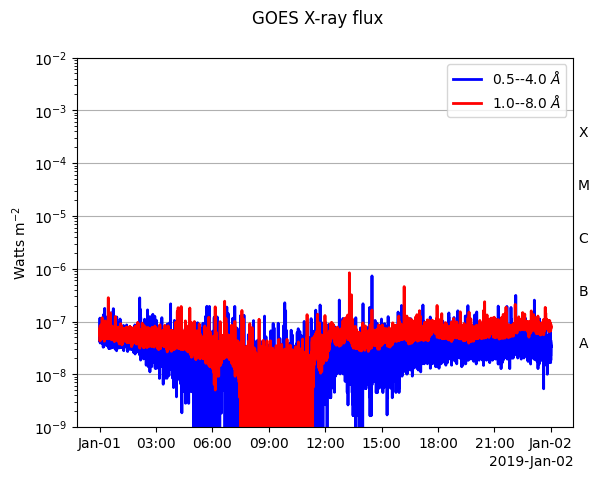

In [112]:
year  = '2019'
month = '01'
day   = '01'

file_path = f'./XRS/sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'

if not os.path.exists(file_path):
    # get the data file
    URL = f'https://data.ngdc.noaa.gov/platforms/solar-space-observing-satellites/goes/goes17/l2/data/xrsf-l2-flx1s_science/{year}/{month}/sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'
    response = requests.get(URL)
    open(os.path.join('./XRS', f'sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'), 'wb').write(response.content)

goes = ts.TimeSeries(file_path)
goes.peek()

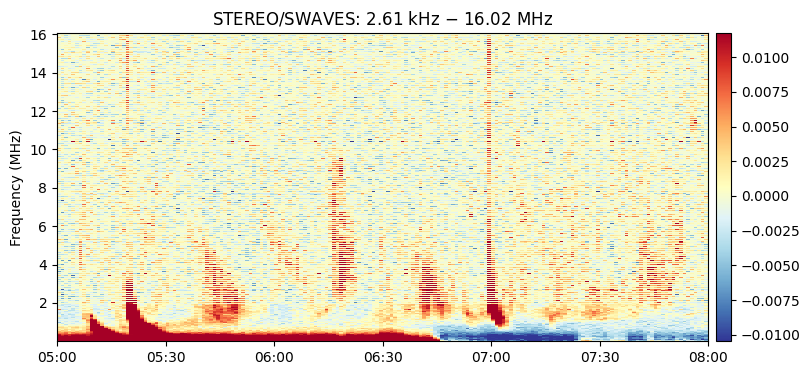

In [189]:
year  = '2021'
month = '09'
day   = '18'

def fetch_STAswaves(year=None, month=None, day=None):
    '''
    Download STEREO/SWAVES data.
        Inputs: year, month, day.
    '''
    file_path = f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf'

    if not os.path.exists(file_path):
        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{year}/stereo_level2_swaves_{year}{month}{day}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./stereo_data', f'stereo_level2_swaves_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)
    
    # read the data values
    cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf')
    time_ste = np.array(cdf_stereo.get('Epoch'))
    freq_ste = np.array(cdf_stereo.get('frequency'))
    data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))
    
    # Min-Max normalization
    min_val = np.min(data_ste_A)
    max_val = np.max(data_ste_A)
    normalized_data_ste_A = (data_ste_A - min_val) / (max_val - min_val)
    
    # subtract the Mean value
    # calculate the mean intensity in each row (freq channel)
    df_ste_A = pd.DataFrame(normalized_data_ste_A.T)
    df_ste_mean = df_ste_A.mean(axis=1)

    # subtract that mean value from each corresponding row
    data_ste_A = pd.DataFrame(normalized_data_ste_A).T.sub(df_ste_mean, axis=0)

    sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(92))

    return time_ste, freq_ste, data_ste_A, sta_norm



time_ste, freq_ste, data_ste_A, sta_norm = fetch_STAswaves(year=year, month=month, day=day)

fig = plt.figure(figsize=[10,4])
ax1 = fig.add_subplot(111)
spect = ax1.pcolormesh(time_ste, freq_ste/1e3, data_ste_A, norm=sta_norm, cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)
# ax1.set_yscale('log')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax1.set_xlim(left=pd.Timestamp(f'{str(time_ste[0].date())} 05:00'),
             right=pd.Timestamp(f'{str(time_ste[0].date())} 08:00'))
plt.show()

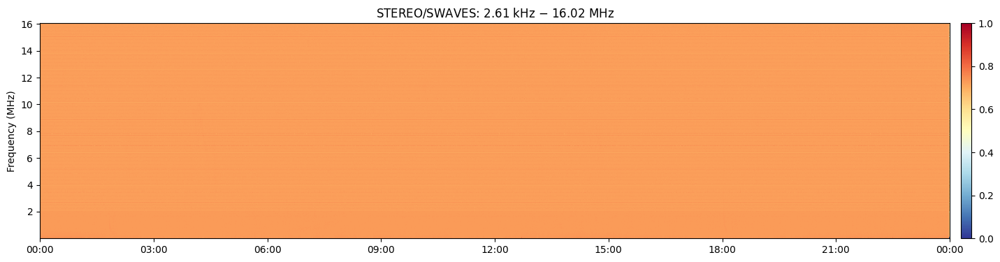

In [254]:
year  = '2021'
month = '09'
day   = '18'

min_max_norm = True
imageNorm = False
gauss = True


def fetch_STAswaves(year=None, month=None, day=None):
    '''
    Download STEREO/SWAVES data.
        Inputs: year, month, day.
    '''
    file_path = f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf'

    if not os.path.exists(file_path):
        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{year}/stereo_level2_swaves_{year}{month}{day}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./stereo_data', f'stereo_level2_swaves_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)
    
    # read the data values
    cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf')
    time_ste = np.array(cdf_stereo.get('Epoch'))
    freq_ste = np.array(cdf_stereo.get('frequency'))
    data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))
    
    if min_max_norm:
        # Min-Max normalization
        min_val = np.min(data_ste_A)
        max_val = np.max(data_ste_A)
        normalized_data_ste_A = (data_ste_A - min_val) / (max_val - min_val)
        return time_ste, freq_ste, normalized_data_ste_A.T
        
    elif imageNorm:
        sta_norm = ImageNormalize(normalized_data_ste_A, interval=PercentileInterval(90), stretch=SqrtStretch(), clip=True)
        return time_ste, freq_ste, normalized_data_ste_A.T, sta_norm

    elif gauss:
        # Apply Gaussian smoothing
        smoothed_data = gaussian_filter(normalized_data_ste_A, sigma=1)
        return time_ste, freq_ste, smoothed_data.T
    
    elif imageNorm and gauss:
        smoothed_data = gaussian_filter(normalized_data_ste_A, sigma=1)
        sta_norm = ImageNormalize(normalized_data_ste_A, interval=PercentileInterval(90), stretch=SqrtStretch(), clip=True)
        return time_ste, freq_ste, smoothed_data.T, sta_norm
    
    elif min_max_norm and gauss:
        min_val = np.min(data_ste_A)
        max_val = np.max(data_ste_A)
        normalized_data_ste_A = (data_ste_A - min_val) / (max_val - min_val)
        smoothed_data = gaussian_filter(normalized_data_ste_A, sigma=1)
        return time_ste, freq_ste, smoothed_data.T

#     sta_norm = ImageNormalize(data_ste_A, vmin=0, vmax=10, clip=True)
#     sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(90))
#     sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(90), stretch=SqrtStretch())



result = fetch_STAswaves(year=year, month=month, day=day)

fig = plt.figure(figsize=[20,4])
ax1 = fig.add_subplot(111)

if len(result) == 4:
    time_ste, freq_ste, data_ste_A, sta_norm = result
    spect = ax1.pcolormesh(time_ste, freq_ste/1e3, normalized_data_ste_A.T, norm=sta_norm, cmap='RdYlBu_r')
else:
    time_ste, freq_ste, data_ste_A = result
    spect = ax1.pcolormesh(time_ste, freq_ste/1e3, normalized_data_ste_A.T, cmap='RdYlBu_r')

fig.colorbar(spect, pad=0.01)
# ax1.set_yscale('log')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
# ax1.set_xlim(left=pd.Timestamp(f'{str(time_ste[0].date())} 05:00'),
#              right=pd.Timestamp(f'{str(time_ste[0].date())} 08:00'))
plt.show()

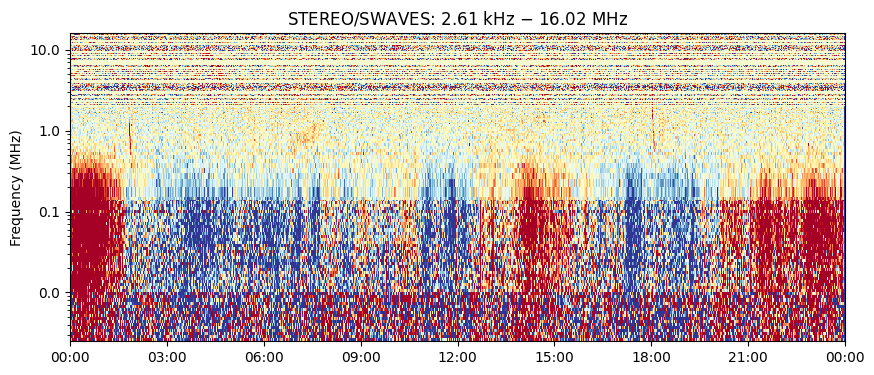

In [22]:
fig = plt.figure(figsize=[10,4])
ax1 = fig.add_subplot(111)
ax1.pcolormesh(time_ste, freq_ste/1e3, data_ste_A, norm=sta_norm, cmap='RdYlBu_r')
ax1.set_yscale('log')
ax1.yaxis.set_major_formatter(ScalarFormatter())
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

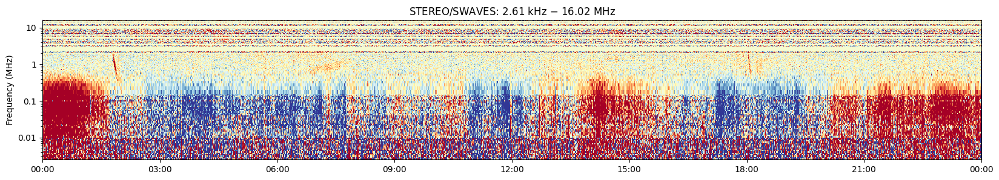

In [28]:
from matplotlib.ticker import ScalarFormatter

fig = plt.figure(figsize=[20,3])
ax1 = fig.add_subplot(111)
ax1.pcolormesh(time_ste, freq_ste/1e3, data_ste_A, norm=sta_norm, cmap='RdYlBu_r')
ax1.set_yscale('log')
ax1.yaxis.set_major_formatter(ScalarFormatter())
# Customize the tick formatter for the y-axis
yticks = [0.01, 0.1, 1, 10]  # Define the major tick positions
ax1.set_yticks(yticks, [str(tick) for tick in yticks])  # Set the tick labels as strings
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

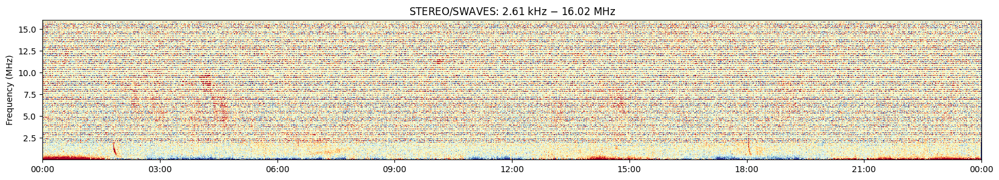

In [36]:
# before normalization
fig = plt.figure(figsize=[20,3])
ax1 = fig.add_subplot(111)
ax1.pcolormesh(time_ste, freq_ste/1e3, data_ste_A, norm=sta_norm, cmap='RdYlBu_r')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

2D array min and max BEFORE normalization: -75.35568237304688 & 29.533355712890625
2D array min and max ATER normalization: 0.0 & 1.0


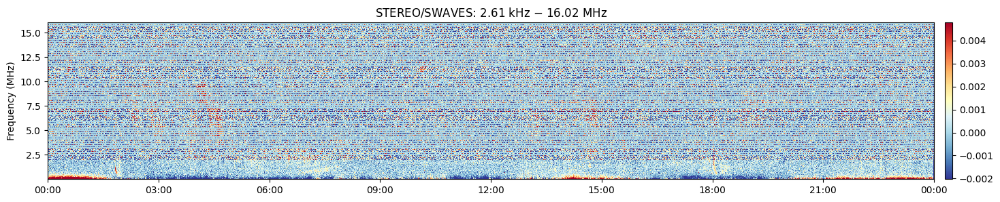

In [128]:
# after normalization
file_path = f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf'

if not os.path.exists(file_path):
    # get the data file
    URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{year}/stereo_level2_swaves_{year}{month}{day}_v02.cdf'
    response = requests.get(URL)
    open(os.path.join('./stereo_data', f'stereo_level2_swaves_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)

# read the data values
cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf')
time_ste = np.array(cdf_stereo.get('Epoch'))
freq_ste = np.array(cdf_stereo.get('frequency'))
data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

print(f'2D array min and max BEFORE normalization: {data_ste_A.min()} & {data_ste_A.max()}')

# Min-Max normalization
min_val = np.min(data_ste_A)
max_val = np.max(data_ste_A)
normalized_data_ste_A = (data_ste_A - min_val) / (max_val - min_val)

print(f'2D array min and max ATER normalization: {normalized_data_ste_A.min()} & {normalized_data_ste_A.max()}')

# # subtract the Mean value
# calculate the mean intensity in each row (freq channel)
df_ste_A = pd.DataFrame(normalized_data_ste_A.T)
df_ste_mean = df_ste_A.mean(axis=1)

# subtract that mean value from each corresponding row
data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

sta_norm = ImageNormalize(data_ste_A, interval=PercentileInterval(97))


fig = plt.figure(figsize=[20,3])
ax1 = fig.add_subplot(111)
spect = ax1.pcolormesh(time_ste, freq_ste/1e3, data_ste_A,
                       norm=sta_norm,
#                        vmin=np.percentile(data_ste_A, 1),
#                        vmax=np.percentile(data_ste_A, 97),
                       cmap='RdYlBu_r')
fig.colorbar(spect, pad=0.01)

# ax1.set_yscale('log')
# ax1.yaxis.set_major_formatter(ScalarFormatter())

ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

In [132]:
str(time_ste[0].date())

'2019-04-25'

In [67]:
# Min-Max normalization
min_val = np.min(data_ste_A)
max_val = np.max(data_ste_A)
normalized_data = (data_ste_A - min_val) / (max_val - min_val)

normalized_data.min(), normalized_data.max()

(0.0, 1.0)

In [3]:
def fetch_PSPfields(year=None, month=None, day=None):
    '''
    Download PSP/FIELDS data.
        Inputs: year, month, day.
    '''
    hfr_file_path = f'./psp_data/psp_fld_l2_rfs_hfr_{year}{month}{day}_v02.cdf'
    lfr_file_path = f'./psp_data/psp_fld_l2_rfs_lfr_{year}{month}{day}_v02.cdf'
    
    if not os.path.exists(hfr_file_path):
        # HFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{year}/{month}/psp_fld_l2_rfs_hfr_{year}{month}{day}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)
    
    if not os.path.exists(lfr_file_path):
        # LFR
        URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{year}/{month}/psp_fld_l2_rfs_lfr_{year}{month}{day}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)

    # load the PSP data
    cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_hfr_{year}{month}{day}_v02.cdf'))
    cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', f'psp_fld_l2_rfs_lfr_{year}{month}{day}_v02.cdf'))

    # the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold
    # convert pixels values to dB
    arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))
    Lp_lfr = 10*np.log10(arr_lfr/10**-16) # z-axis
    tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr')) # x-axis
    freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

    # convert pixels values to dB
    arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
    Lp_hfr = 10*np.log10(arr_hfr/10**-16) # z-axis
    tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr')) # x-axis
    freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

    # clean the dyspec by subtracting the Mean intensity from each freq channel
    df_psp_hfr = pd.DataFrame(Lp_hfr.T)
    df_psp_lfr = pd.DataFrame(Lp_lfr.T)

    # concat the two arrays of both bands
    df_lfr = pd.DataFrame(df_psp_lfr)
    df_lfr.insert(loc=0, column='frequency', value=freq_lfr[0])
    df_lfr.set_index(['frequency'], inplace=True)

    df_hfr = pd.DataFrame(df_psp_hfr)
    df_hfr.insert(loc=0, column='frequency', value=freq_hfr[0])
    df_hfr.set_index(['frequency'], inplace=True)

    # drop the overlapped rows, take only the first row of the duplicated group
    df_psp = pd.concat([df_lfr, df_hfr])
    df_psp = df_psp.sort_index(axis=0)
#     df_psp = df_psp[~df_psp.index.duplicated(keep='first')]
    df_psp.columns = max([tm_lfr, tm_hfr], key=len)
    
    psp_norm = ImageNormalize(df_psp.values, interval=PercentileInterval(90))

    return tm_lfr, tm_hfr, df_lfr, df_hfr, df_psp, psp_norm



tm_lfr, tm_hfr, df_lfr, df_hfr, df_psp, psp_norm = fetch_PSPfields(year='2021', month='01', day='04')

In [ ]:
fig = plt.figure(figsize=[10,4])
ax1 = fig.add_subplot(111)
ax1.imshow(df_psp.values, aspect='auto', origin='lower', norm=psp_norm,
            extent=[mdates.date2num(df_psp.columns[0]), mdates.date2num(df_psp.columns[-1]),
                    df_psp.index[0], df_psp.index[-1]], cmap='RdYlBu_r')
# ax1.set_yscale('log')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

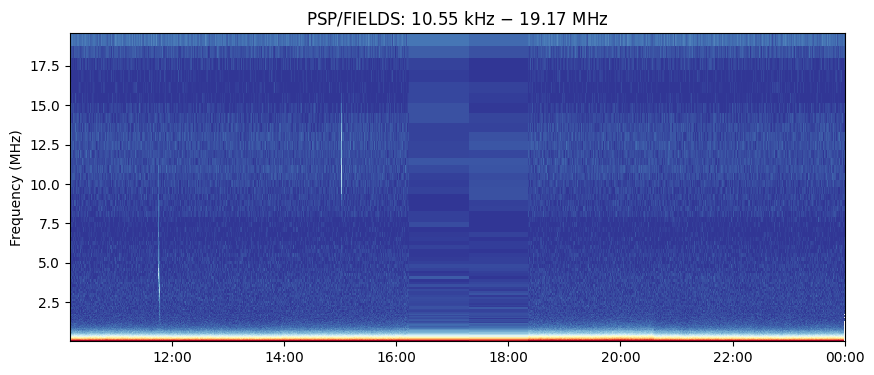

In [141]:
fig = plt.figure(figsize=[10,4])
ax1 = fig.add_subplot(111)
ax1.pcolormesh(df_psp.columns, df_psp.index, df_psp.values, norm=psp_norm, cmap='RdYlBu_r')
# ax1.set_yscale('log')
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f'PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
plt.show()

In [ ]:
from sunpy.net.cdaweb import get_datasets

datasets = get_datasets('WIND')

In [46]:
# datasets

In [45]:
# a.cdaweb.Dataset

In [81]:
# print(datasets.loc['WI_H1_WAV']['Label'])
# print(datasets.loc['WI_H1_WAV'][['Start', 'End']])

In [90]:
# wind_res = Fido.search(a.Time('2021-09-18', '2021-09-19'), a.cdaweb.Dataset('WI_H1_WAV'))

# wind_instrument = wind_res['cdaweb']['URL'][0].split('/')[6]
# wind_datatype = wind_res['cdaweb']['URL'][0].split('/')[-3]
# wind_file = wind_res['cdaweb']['URL'][0].split('/')[-1]

# wind_waves = Fido.fetch(wind_res, path=f'./{wind_instrument}/{wind_datatype}/{wind_file}')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

wi_h1_wav_20210918_v01.cdf:   0%|          | 0.00/3.59M [00:00<?, ?B/s]

In [84]:
# [file.split('/')[-1] for file in wind_res['cdaweb']['URL']]

['wi_h0_wav_20210918_v01.cdf']

In [80]:
# for x, y in zip(datasets['Id'], datasets['Label']):
#     print(f'{x} \t {y}')

# Test the script here ...

In [35]:
import warnings
warnings.filterwarnings('ignore')

import os
os.environ['CDF_LIB'] = '/home/peijin/cdf/cdf38_0-dist/lib'

import sys
import time
import requests
import argparse
import datetime
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.dates import DateFormatter
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import matplotlib.dates as mdates
from matplotlib.ticker import ScalarFormatter

from astropy import units as u
from astropy.visualization import ImageNormalize, SqrtStretch, PercentileInterval

import sunpy.map
from sunpy import timeseries as ts
from sunpy.net import Fido, attrs as a

from scipy.ndimage import gaussian_filter
from solarmach import SolarMACH
import pyspedas
# from pytplot import tplot
# from pytplot import options
from pytplot import get_data
from spacepy import pycdf

mpl.rcParams['date.epoch'] = '1970-01-01T00:00:00'
try:
    mdates.set_epoch('1970-01-01T00:00:00')
except:
    pass

#plt.style.use('seaborn')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'







# Define custom tick formatter for y-axis
def custom_formatter(x, pos):
    return f'{x:.2f}'



def minmax_normalize(arr=None):
    '''
    Min-Max normalization.
    '''
    min_val = np.min(arr)
    max_val = np.max(arr)
    arr_norm = (arr - min_val) / (max_val - min_val)
    return arr_norm



def split_date(dt=None):
    '''
    Split a datetime object into year, month, and day, and return them as strings.
        dt: Datetime/Timestamp object.
    '''
    YEAR = dt.date().year
    MONTH = dt.date().month
    DAY = dt.date().day
    
    if DAY < 10:
        DAY = f'0{DAY}'
    else:
        DAY = f'{DAY}'
    
    if MONTH < 10:
        MONTH = f'0{MONTH}'
    else:
        MONTH = f'{MONTH}'
    
    return YEAR, MONTH, DAY




def fetch_locations(dt=None):
    '''
    Download the locations of instruments.
        dt: Datetime/Timestamp object.
    '''
    if dt.year == 2019:
        body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP']
    else:
        body_list = ['Earth', 'Mars', 'STEREO-A', 'PSP', 'Solo']
    
    vsw_list = [] # [400, 400, 400, 400, 400]        # leave empty to obtain measurements
    date_solmach = str(dt)
    coord_sys = 'Stonyhurst'                         # 'Carrington' (default) or 'Stonyhurst'
    reference_long = None                            # longitude of reference (None to omit)
    reference_lat = None                             # latitude of reference (None to omit)
    long_offset = 270                                # longitudinal offset for polar plot; defines where Earth's longitude is (by default 270, i.e., at "6 o'clock")
    plot_spirals = True                              # plot Parker spirals for each body
    plot_sun_body_line = False                       # plot straight line between Sun and body
    return_plot_object = False                       # figure and axis object of matplotib are returned, allowing further adjustments to the figure
    transparent = True                               # make output figure background transparent
    numbered_markers = True                          # plot each body with a numbered marker

    # initialize
    sm = SolarMACH(date_solmach, body_list, vsw_list, reference_long, reference_lat, coord_sys)

    # make plot
    sm.plot(plot_spirals=plot_spirals,
                                    plot_sun_body_line=plot_sun_body_line,
                                    transparent=transparent,
                                    numbered_markers=numbered_markers,
                                    long_offset=long_offset,
                                    return_plot_object=return_plot_object,
                                    figsize=[17,10],
                                    outfile=f'./locations/{dt.date()}.png')




def fetch_xrs(dt=None, year=None, month=None, day=None):
    '''
    Download GOES/XRS data.
        dt: Datetime/Timestamp object.
        Inputs: year, month, day.
    '''
    if year == 2019:
        # Check if the file doesn't exist
        file_path = f'./XRS/sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'

        if not os.path.exists(file_path):
            # get the data file
            URL = f'https://data.ngdc.noaa.gov/platforms/solar-space-observing-satellites/goes/goes17/l2/data/xrsf-l2-flx1s_science/{year}/{month}/sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'
            response = requests.get(URL)
            open(os.path.join('./XRS', f'sci_xrsf-l2-flx1s_g17_d{year}{month}{day}_v2-2-0.nc'), 'wb').write(response.content)

        goes = ts.TimeSeries(file_path)
    else:
        file_path = f'./XRS/sci_xrsf-l2-avg1m_g16_d{year}{month}{day}_v2-2-0.nc'
        
        if not os.path.exists(file_path):
            goes_result = Fido.search(a.Time(f'{dt.date()}', f'{dt.date()}'), a.Instrument('XRS'), a.goes.SatelliteNumber(16))
            goes_file = Fido.fetch(goes_result, path='./{instrument}/{file}')
            goes = ts.TimeSeries(goes_file)
        else:
            goes = ts.TimeSeries(file_path)
    return goes




def fetch_aia(dt=None, year=None, month=None, day=None):
    '''
    Download SDO/AIA data.
        dt: Datetime/Timestamp object.
        Inputs: year, month, day.
    '''
    file193_path = f'./AIA/aia_lev1_193a_{year}_{month}_{day}t00_00_04_84z_image_lev1.fits'
    file171_path = f'./AIA/aia_lev1_171a_{year}_{month}_{day}t00_00_04_84z_image_lev1.fits'
    file211_path = f'./AIA/aia_lev1_211a_{year}_{month}_{day}t00_00_04_84z_image_lev1.fits'
    file94_path = f'./AIA/aia_lev1_94a_{year}_{month}_{day}t00_00_04_84z_image_lev1.fits'
    
    # Corona and hot flare plasma
    if not os.path.exists(file193_path):
        result193 = Fido.search(a.Time(f'{dt}', f'{dt + datetime.timedelta(minutes=1)}'),
                                    a.Instrument('AIA'),
                                    a.Wavelength(193*u.angstrom),
                                    a.Sample(1*u.min))
        aia193 = Fido.fetch(result193, path='./{instrument}/{file}')
        m193 = sunpy.map.Map(aia193)
    else:
        m193 = sunpy.map.Map(aia193)
    
    # Quiet corona, upper transition region
    if not os.path.exists(file171_path):
        result171 = Fido.search(a.Time(f'{dt}', f'{dt + datetime.timedelta(minutes=1)}'),
                                    a.Instrument('AIA'),
                                    a.Wavelength(171*u.angstrom),
                                    a.Sample(1*u.min))
        aia171 = Fido.fetch(result171, path='./{instrument}/{file}')
        m171 = sunpy.map.Map(aia171)
    else:
        m171 = sunpy.map.Map(aia171)
    
    # Active region corona
    if not os.path.exists(file211_path):
        result211 = Fido.search(a.Time(f'{dt}', f'{dt + datetime.timedelta(minutes=1)}'),
                                    a.Instrument('AIA'),
                                    a.Wavelength(211*u.angstrom),
                                    a.Sample(1*u.min))
        aia211 = Fido.fetch(result211, path='./{instrument}/{file}')
        m211 = sunpy.map.Map(aia211)
    else:
        m211 = sunpy.map.Map(aia211)
    
    # Flaring regions
    if not os.path.exists(file94_path):
        result94 = Fido.search(a.Time(f'{dt}', f'{dt + datetime.timedelta(minutes=1)}'),
                                    a.Instrument('AIA'),
                                    a.Wavelength(94*u.angstrom),
                                    a.Sample(1*u.min))
        aia94 = Fido.fetch(result94, path='./{instrument}/{file}')
        m94 = sunpy.map.Map(aia94)
    else:
        m94 = sunpy.map.Map(aia94)
    
    # calibrate AIA map to level 1.5
    m211_updated_pointing = update_pointing(m211)
    m211_registered = register(m211_updated_pointing)
    m211_normalized = normalize_exposure(m211_registered)

    m193_updated_pointing = update_pointing(m193)
    m193_registered = register(m193_updated_pointing)
    m193_normalized = normalize_exposure(m193_registered)

    m171_updated_pointing = update_pointing(m171)
    m171_registered = register(m171_updated_pointing)
    m171_normalized = normalize_exposure(m171_registered)

    m94_updated_pointing = update_pointing(m94)
    m94_registered = register(m94_updated_pointing)
    m94_normalized = normalize_exposure(m94_registered)
    
    # Plot the four panels
    fig = plt.figure(figsize=[10,10])
    
    ax = fig.add_subplot(221, projection=m94_normalized)
    m94_normalized.plot(axes=ax, vmin=0)

    ax = fig.add_subplot(222, projection=m211_normalized)
    m211_normalized.plot(axes=ax, vmin=0)

    ax = fig.add_subplot(223, projection=m193_normalized)
    m193_normalized.plot(axes=ax, vmin=0)

    ax = fig.add_subplot(224, projection=m171_normalized)
    m171_normalized.plot(axes=ax, vmin=0)

    fig.tight_layout()
    fig.savefig(f'./AIA/aia_panels_{dt.date()}.png', format='png', dpi=300, bbox_inches='tight')
    plt.close()



def fetch_waves(dt=None, year=None, month=None, day=None):
    '''
    Download Wind/WAVES data.
        dt: Datetime/Timestamp object.
        Inputs: year, month, day.
    '''
    file_path = f'./wind_data/waves/wav_h1/{year}/wi_h1_wav_{year}{month}{day}_v01.cdf'
    
    if not os.path.exists(file_path):
        print('Wind/WAVES data file not exist!')
        print('Proceed to fetch data from the server ..')
        
        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/wind/waves/wav_h1/{year}/wi_h1_wav_{year}{month}{day}_v01.cdf'
        response = requests.get(URL)
        open(os.path.join(f'./wind_data/waves/wav_h1/{year}', f'wi_h1_wav_{year}{month}{day}_v01.cdf'), 'wb').write(response.content)
        
        print('Wind/WAVES data is downloaded locally.')
        wind = pycdf.CDF(f'./wind_data/waves/wav_h1/{year}/wi_h1_wav_{year}{month}{day}_v01.cdf')
    else:
        print('Wind/WAVES data exists locally.')
        wind = pycdf.CDF(f'./wind_data/waves/wav_h1/{year}/wi_h1_wav_{year}{month}{day}_v01.cdf')
        
    wind_time = [mdates.date2num(tm) for tm in pd.to_datetime(wind.get('Epoch'))]
    RAD1_freq = np.array(wind.get('Frequency_RAD1'))
    RAD2_freq = np.array(wind.get('Frequency_RAD2'))
    TNR_freq = np.array(wind.get('Frequency_TNR'))
    RAD1_int = np.array(wind.get('E_VOLTAGE_RAD1'))
    RAD2_int = np.array(wind.get('E_VOLTAGE_RAD2'))
    TNR_int = np.array(wind.get('E_VOLTAGE_TNR'))

    wind_freq = np.concatenate((TNR_freq, RAD1_freq, RAD2_freq))
    wind_data = np.concatenate((TNR_int, RAD1_int, RAD2_int), axis=1)

    # Apply Gaussian smoothing
    smoothed_wind = gaussian_filter(wind_data, sigma=1)
        
    wind_norm = ImageNormalize(smoothed_wind, interval=PercentileInterval(97), clip=True)
    
    return wind_time, wind_freq, smoothed_wind, wind_norm



def fetch_STAswaves(year=None, month=None, day=None):
    '''
    Download STEREO/SWAVES data.
        Inputs: year, month, day.
    '''
    file_path = f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf'

    if not os.path.exists(file_path):
        # get the data file
        URL = f'https://spdf.gsfc.nasa.gov/pub/data/stereo/combined/swaves/level2_cdf/{year}/stereo_level2_swaves_{year}{month}{day}_v02.cdf'
        response = requests.get(URL)
        open(os.path.join('./stereo_data', f'stereo_level2_swaves_{year}{month}{day}_v02.cdf'), 'wb').write(response.content)
    
    # read the data values
    cdf_stereo = pycdf.CDF(f'./stereo_data/stereo_level2_swaves_{year}{month}{day}_v02.cdf')
    time_ste = np.array(cdf_stereo.get('Epoch'))
    freq_ste = np.array(cdf_stereo.get('frequency'))
    data_ste_A = np.array(cdf_stereo.get('avg_intens_ahead'))

    # calculate the mean value in each row (freq channel)
    # and subtract it from each corresponding row
    df_ste_A = pd.DataFrame(data_ste_A.T)
    df_ste_mean = df_ste_A.mean(axis=1)
    data_ste_A = df_ste_A.sub(df_ste_mean, axis=0)

    # Apply Gaussian smoothing
    smoothed_ste_A = gaussian_filter(data_ste_A, sigma=1)

    ste_norm = ImageNormalize(smoothed_ste_A, interval=PercentileInterval(97), clip=True)

    return time_ste, freq_ste, smoothed_ste_A, ste_norm




def fetch_PSPfields(year=None, month=None, day=None, data_version=2):
    '''
    Download PSP/FIELDS data.
        Inputs: year, month, day.
    '''
    hfr_file_path = f'psp_fld_l2_rfs_hfr_{year}{month}{day}_v0{data_version}.cdf'
    lfr_file_path = f'psp_fld_l2_rfs_lfr_{year}{month}{day}_v0{data_version}.cdf'
    
    HFR_URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_hfr/{year}/{month}/{hfr_file_path}'
    LFR_URL = f'http://research.ssl.berkeley.edu/data/psp/data/sci/fields/l2/rfs_lfr/{year}/{month}/{lfr_file_path}'

    hfr_response = requests.head(HFR_URL)
    lfr_response = requests.head(LFR_URL)

    if hfr_response.status_code == 200 and lfr_response.status_code == 200:
        # Files are available, proceed with download
        if not os.path.exists(hfr_file_path):
            response = requests.get(HFR_URL)
            open(os.path.join('./psp_data', hfr_file_path), 'wb').write(response.content)
        
        if not os.path.exists(lfr_file_path):
            response = requests.get(LFR_URL)
            open(os.path.join('./psp_data', lfr_file_path), 'wb').write(response.content)
        
        # load the PSP data
        cdf_psp_hfr = pycdf.CDF(os.path.join('./psp_data', hfr_file_path))
        cdf_psp_lfr = pycdf.CDF(os.path.join('./psp_data', lfr_file_path))

        # the min power scaled power spectral density (PSD) of 1e-16 is used as a threshold
        # convert pixels values to dB
        arr_lfr = np.array(cdf_psp_lfr.get('psp_fld_l2_rfs_lfr_auto_averages_ch0_V1V2'))
        Lp_lfr = 10*np.log10(arr_lfr/10**-16) # z-axis
        tm_lfr = np.array(cdf_psp_lfr.get('epoch_lfr')) # x-axis
        freq_lfr = np.array(cdf_psp_lfr.get('frequency_lfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # convert pixels values to dB
        arr_hfr = np.array(cdf_psp_hfr.get('psp_fld_l2_rfs_hfr_auto_averages_ch0_V1V2'))
        Lp_hfr = 10*np.log10(arr_hfr/10**-16) # z-axis
        tm_hfr = np.array(cdf_psp_hfr.get('epoch_hfr')) # x-axis
        freq_hfr = np.array(cdf_psp_hfr.get('frequency_hfr_auto_averages_ch0_V1V2'))/10**6 # y-axis

        # clean the dyspec by subtracting the Mean intensity from each freq channel
        df_psp_hfr = pd.DataFrame(Lp_hfr.T)
        df_psp_lfr = pd.DataFrame(Lp_lfr.T)

        # concat the two arrays of both bands
        df_lfr = pd.DataFrame(df_psp_lfr)
        df_lfr.insert(loc=0, column='frequency', value=freq_lfr[0])
        df_lfr.set_index(['frequency'], inplace=True)

        df_hfr = pd.DataFrame(df_psp_hfr)
        df_hfr.insert(loc=0, column='frequency', value=freq_hfr[0])
        df_hfr.set_index(['frequency'], inplace=True)

        # drop the overlapped rows, take only the first row of the duplicated group
        df_psp = pd.concat([df_lfr, df_hfr])
        df_psp = df_psp.sort_index(axis=0)
        df_psp = df_psp[~df_psp.index.duplicated(keep='first')]
        df_psp.columns = max([tm_lfr, tm_hfr], key=len)
        
        # calculate the mean value in each row (freq channel)
        # and subtract it from each corresponding row
        df_psp_mean = df_psp.mean(axis=1)
        df_psp_submean = df_psp.sub(df_psp_mean, axis=0)
        
        # Check for NaN and -inf values and replace them with zero
        df_psp_submean.replace([np.nan, -np.inf], 0, inplace=True)

        # Apply Gaussian smoothing
        psp_submean_smooth = gaussian_filter(df_psp_submean, sigma=1)
        df_smoothed_psp = pd.DataFrame(psp_submean_smooth, index=df_psp.index, columns=df_psp.columns)

        psp_norm = ImageNormalize(psp_submean_smooth, interval=PercentileInterval(97), clip=True)
        
        return df_smoothed_psp, psp_norm
    
    else:
        # Files are not available
        print('PSP/FIELD data is not available on the website!\n')
        return None

In [40]:
t = pd.Timestamp('2021-09-18')

data_dict = {
    'date': [],
    'wind_time': [],
    'wind_freq': [],
    'wind_spect': [],
    'wind_spectNorm': [],
    'stereo_time': [],
    'stereo_freq': [],
    'stereo_spect': [],
    'stereo_spectNorm': [],
    'psp_time': [],
    'psp_freq': [],
    'psp_spect': [],
    'psp_spectNorm': [],
#     'aia_map': [],
    'goes_xrs': []
}

print(t, '\n')

YEAR, MONTH, DAY = split_date(dt=t)

#################################################################
######################### S/C locations #########################
#################################################################

try:
    fetch_locations(dt=t)
    print('Locations data is exported.')
except:
    print('Locations data are missing!')

#######################################################
######################### XRS #########################
#######################################################

try:
    goes = fetch_xrs(dt=t, year=YEAR, month=MONTH, day=DAY)
    print('GOES data is loaded.')
except:
    print('GOES data is missing!')
    goes = []

#######################################################
######################### AIA #########################
#######################################################

fetch_aia(dt=t)
print('AIA panels are exported.')
    
# try:
#     fetch_aia(dt=t)
#     print('AIA panels are exported.')
# except:
#     print('AIA data is missing!')

########################################################
######################### WIND #########################
########################################################

wind_result = fetch_waves(dt=t, year=YEAR, month=MONTH, day=DAY)

if wind_result is not None:
    wind_time, wind_freq, wind_data, wind_norm = wind_result
    print('Wind data is loaded.')
else:
    print('Wind data is missing!')
    wind_time = []
    wind_freq = []
    wind_data = []
    wind_norm = []

########################################################
######################### STA ##########################
########################################################

steA_result = fetch_STAswaves(year=YEAR, month=MONTH, day=DAY)

if steA_result is not None:
    time_ste, freq_ste, data_ste_A, ste_norm = steA_result
    print('STEREO data is loaded.')
else:
    print('STEREO data is missing!')
    time_ste = []
    freq_ste = []
    data_ste_A = []
    ste_norm = []

#######################################################
######################### PSP #########################
#######################################################

psp_result = fetch_PSPfields(year=YEAR, month=MONTH, day=DAY, data_version=3)

if psp_result is not None:
    df_psp, psp_norm = psp_result
    print('PSP data is loaded.')
else:
    print('PSP data is missing!')
    df_psp = []
    psp_norm = []

#######################################################

# store the data in a dict object
if t:
    data_dict['date'].append(t)
else:
    data_dict['date'].append([])

if len(wind_time)>1 and len(wind_freq)>1 and len(wind_data)>1 and wind_norm:
    data_dict['wind_time'].append(wind_time)
    data_dict['wind_freq'].append(wind_freq)
    data_dict['wind_spect'].append(wind_data.T)
    data_dict['wind_spectNorm'].append(wind_norm)
else:
    data_dict['wind_time'].append([])
    data_dict['wind_freq'].append([])
    data_dict['wind_spect'].append([])
    data_dict['wind_spectNorm'].append([])

if len(time_ste)>1 and len(freq_ste)>1 and len(data_ste_A)>1 and ste_norm:
    data_dict['stereo_time'].append(time_ste)
    data_dict['stereo_freq'].append(freq_ste)
    data_dict['stereo_spect'].append(data_ste_A)
    data_dict['stereo_spectNorm'].append(ste_norm)
else:
    data_dict['stereo_time'].append([])
    data_dict['stereo_freq'].append([])
    data_dict['stereo_spect'].append([])
    data_dict['stereo_spectNorm'].append([])

if any(df_psp) and psp_norm:
    data_dict['psp_time'].append(df_psp.columns)
    data_dict['psp_freq'].append(df_psp.index)
    data_dict['psp_spect'].append(df_psp.values)
    data_dict['psp_spectNorm'].append(psp_norm)
else:
    data_dict['psp_time'].append([])
    data_dict['psp_freq'].append([])
    data_dict['psp_spect'].append([])
    data_dict['psp_spectNorm'].append([])

# if m:
#     data_dict['aia_map'].append(m)
# else:
#     data_dict['aia_map'].append([])

# Check if GOES obj is a list
if goes:
    if isinstance(goes, list):
        data_dict['goes_xrs'].append(goes[0]) # goes[0]: 1-s; goes[1]: 1-m resolution.
    else:
        data_dict['goes_xrs'].append(goes)
else:
    data_dict['goes_xrs'].append([])

print('All data are loaded successfully to the dictinoary object.')
print(f'Day {t} has been analyzed.\n')

2021-09-18 00:00:00 

No solar wind speeds defined, trying to obtain measurements...
Locations data are missing!
GOES data is loaded.


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

AIA panels are exported.
Wind/WAVES data exists locally.
Wind data is loaded.
STEREO data is loaded.
PSP data is loaded.
All data are loaded successfully to the dictinoary object.
Day 2021-09-18 00:00:00 has been analyzed.



Making the panels ..
Doing 2021-09-18 00:00:00 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plot is ready.
Locations map is ready.
AIA map is ready.
Exporting the figure at: ./plots/summary_plot_2021-09-18.png
Summary plot for 2021-09-18 00:00:00 has been exported successfully.



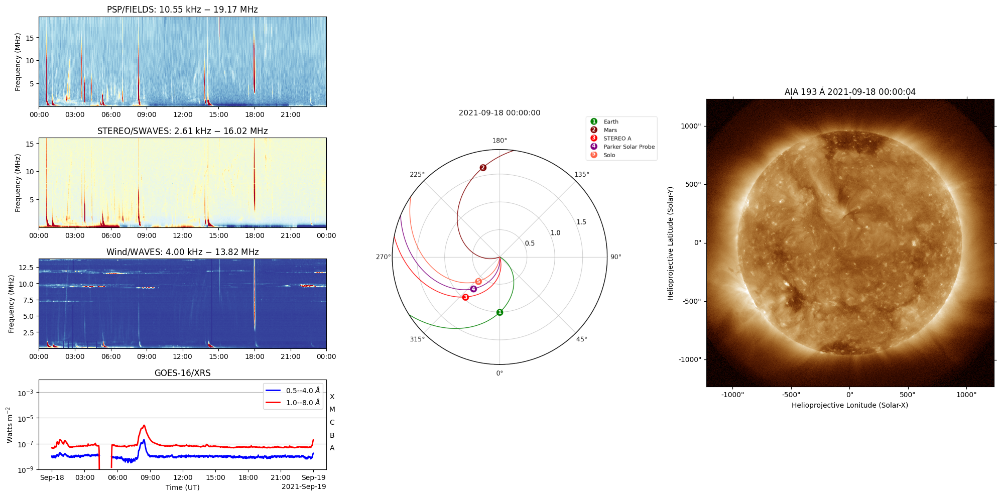

In [53]:
############################################################
######################### BIG PLOT #########################
############################################################

print('Making the panels ..')

i = 0
print(f"Doing {str(data_dict['date'][i])} ..")

fig = plt.figure(figsize=[20,10])
gs = GridSpec(4, 3, figure=fig)

if any(df_psp) and psp_norm:
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.pcolormesh(data_dict['psp_time'][i],
                    data_dict['psp_freq'][i],
                    data_dict['psp_spect'][i],
                    norm=data_dict['psp_spectNorm'][i],
                    cmap='RdYlBu_r')
    ax1.set_ylabel('Frequency (MHz)')
    ax1.set_title(f"PSP/FIELDS: {data_dict['psp_freq'][i][0]*1e3:.2f} kHz $-$ {data_dict['psp_freq'][i][-1]:.2f} MHz")
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
#     ax1.set_yscale('log')
#     ax1.yaxis.set_major_formatter(custom_formatter)
    print('PSP plot is ready.')

if len(time_ste)>1 and len(freq_ste)>1 and len(data_ste_A)>1:
    ax2 = fig.add_subplot(gs[1, 0])
    ax2.pcolormesh(data_dict['stereo_time'][i],
                    data_dict['stereo_freq'][i]/1e3,
                    data_dict['stereo_spect'][i],
                    norm=data_dict['stereo_spectNorm'][i],
                    cmap='RdYlBu_r')
    ax2.grid(False)
    ax2.set_ylabel('Frequency (MHz)')
    ax2.set_title(f"STEREO/SWAVES: {data_dict['stereo_freq'][i][0]:.2f} kHz $-$ {data_dict['stereo_freq'][i][-1]/1e3:.2f} MHz")
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
#     ax2.set_yscale('log')
#     ax2.yaxis.set_major_formatter(custom_formatter)
    print('STEREO plot is ready.')

if len(wind_time)>1 and len(wind_freq)>1 and len(wind_data)>1:
    ax3 = fig.add_subplot(gs[2, 0])
    ax3.pcolormesh(data_dict['wind_time'][i],
                    data_dict['wind_freq'][i]/1e3,
                    data_dict['wind_spect'][i],
                    norm=data_dict['wind_spectNorm'][i],
                    cmap='RdYlBu_r')
    ax3.set_ylabel('Frequency (MHz)')
    ax3.set_title(f"Wind/WAVES: {data_dict['wind_freq'][i][0]:.2f} kHz $-$ {data_dict['wind_freq'][i][-1]/1e3:.2f} MHz")
    ax3.xaxis_date()
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
#     ax3.set_yscale('log')
#     ax3.yaxis.set_major_formatter(custom_formatter)
    print('Wind plot is ready.')

if goes:
    ax4 = fig.add_subplot(gs[3, 0])
    data_dict['goes_xrs'][i].plot(axes=ax4)
    ax4.set_xlabel('Time (UT)')
    ax4.set_title(f"{data_dict['goes_xrs'][i].observatory}/{data_dict['goes_xrs'][i].source.upper()}")
    print('GOES plot is ready.')

# Load the PNG image
if os.path.exists(f"./locations/{data_dict['date'][i].date()}.png"):
    img = mpimg.imread(f"./locations/{data_dict['date'][i].date()}.png")
    ax5 = fig.add_subplot(gs[:, 1])
    ax5.imshow(img)
    ax5.axis('off')
    print('Locations map is ready.')

# if os.path.exists(f"./AIA/aia_panels_{data_dict['date'][i].date()}.png"):
#     img = mpimg.imread(f"./AIA/aia_panels_{data_dict['date'][i].date()}.png")
#     ax5 = fig.add_subplot(gs[:, 1:])
#     ax5.imshow(img)
#     ax5.axis('off')
#     print('AIA panels are ready.')

# if os.path.exists(f"./AIA/aia_panels_{data_dict['date'][i].date()}.png"):
#     img = mpimg.imread(f"./AIA/aia_panels_{data_dict['date'][i].date()}.png")
#     ax6 = fig.add_subplot(gs[:, 2])
#     ax6.imshow(img)
#     ax6.axis('off')
#     print('AIA panels are ready.')

if m:
    ax6 = fig.add_subplot(gs[:, 2], projection=m)
    m.plot(axes=ax6, clip_interval=(1, 99.99)*u.percent)
    ax6.grid(False)
    ax6.set_xlabel('Helioprojective Lonitude (Solar-X)')
    ax6.set_ylabel('Helioprojective Latitude (Solar-Y)')
    print('AIA map is ready.')

print(f"Exporting the figure at: ./plots/summary_plot_{data_dict['date'][i].date()}.png")
fig.tight_layout()
# fig.savefig(f"./summary_plot_{data_dict['date'][i].date()}.png", format='png', dpi=300, bbox_inches='tight')
print(f"Summary plot for {data_dict['date'][i]} has been exported successfully.\n")
plt.show()

In [54]:
# plt.figure(figsize=[20,4])
# plt.imshow(data_dict['wind_spect'][i], aspect='equal', origin='lower', vmin=0, vmax=0.12, cmap='magma')
# plt.colorbar(shrink=0.8, pad=0.01)
# plt.show()

1439

Doing 2021-09-18 00:00:09.630000 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plot is ready.
AIA map is ready.
Exporting the figure at: ./plots/monitor/monitor_plot_2021-09-18 00:00:09.630000.png
Summary plot for 2021-09-18 00:00:09.630000 has been exported successfully.



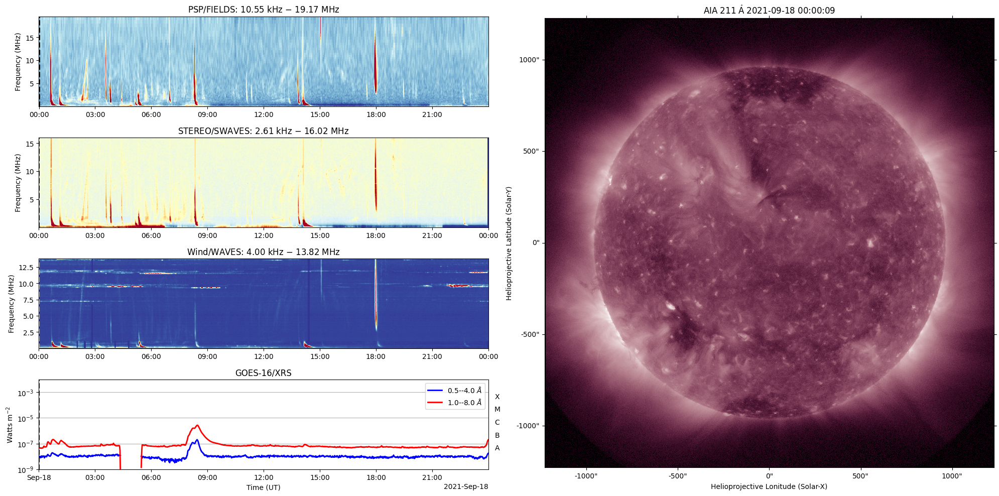

In [103]:
import glob

# Load AIA data
aia_files = sorted(glob.glob(f'./AIA/*211*_{YEAR}_{MONTH}_{DAY}*.fits'))
print(len(aia_files))

# load and calibrate the map
aiamap = sunpy.map.Map(aia_files[0])
aiamap_updated_pointing = update_pointing(aiamap)
aiamap_registered = register(aiamap_updated_pointing)
aiamap_normalized = normalize_exposure(aiamap_registered)

moment = pd.Timestamp(aiamap_normalized.meta['date-obs'])

print(f'\nDoing {moment} ..')

fig = plt.figure(figsize=[20,10])
gs = GridSpec(4, 2, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax1.pcolormesh(df_psp.columns,
               df_psp.index,
               df_psp.values,
               norm=psp_norm,
               cmap='RdYlBu_r')
ax1.axvline(x=moment, color='k', ls='--', lw=2)
ax1.set_ylabel('Frequency (MHz)')
ax1.set_title(f"PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz")
ax1.xaxis_date()
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
print('PSP plot is ready.')

ax2 = fig.add_subplot(gs[1, 0])
ax2.pcolormesh(time_ste,
               freq_ste/1e3,
               data_ste_A,
               norm=ste_norm,
               cmap='RdYlBu_r')
ax2.axvline(x=moment, color='k', ls='--', lw=2)
ax2.grid(False)
ax2.set_ylabel('Frequency (MHz)')
ax2.set_title(f"STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz")
ax2.xaxis_date()
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
print('STEREO plot is ready.')

ax3 = fig.add_subplot(gs[2, 0])
ax3.pcolormesh(wind_time,
               wind_freq/1e3,
               wind_data.T,
               norm=wind_norm,
               cmap='RdYlBu_r')
ax3.axvline(x=moment, color='w', ls='--', lw=2)
ax3.set_ylabel('Frequency (MHz)')
ax3.set_title(f"Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz")
ax3.xaxis_date()
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
print('Wind plot is ready.')

ax4 = fig.add_subplot(gs[3, 0])
goes.plot(axes=ax4)
ax4.set_xlim(left=mdates.date2num(pd.Timestamp(str(goes.time_range.start))),
             right=mdates.date2num(pd.Timestamp(str(goes.time_range.end))))
ax4.axvline(x=moment, color='k', ls='--', lw=2)
ax4.set_xlabel('Time (UT)')
ax4.set_title(f"{goes.observatory}/{goes.source.upper()}")
print('GOES plot is ready.')

ax5 = fig.add_subplot(gs[:, 1], projection=aiamap_normalized)
aiamap_normalized.plot(axes=ax5, vmin=0)
ax5.grid(False)
ax5.set_xlabel('Helioprojective Lonitude (Solar-X)')
ax5.set_ylabel('Helioprojective Latitude (Solar-Y)')
print('AIA map is ready.')

print(f'Exporting the figure at: ./plots/monitor/monitor_plot_{moment}.png')
fig.tight_layout()
fig.savefig(f'./plots/monitor/monitor_plot_{moment}.png', format='png', dpi=300, bbox_inches='tight')
print(f'Summary plot for {moment} has been exported successfully.\n')
plt.show()

In [ ]:
for i, file in enumerate(aia_files[500:1000]):
    print(f'File Number: {i} ..')
    
    # load and calibrate the map
    aiamap = sunpy.map.Map(file)
    aiamap_updated_pointing = update_pointing(aiamap)
    aiamap_registered = register(aiamap_updated_pointing)
    aiamap_normalized = normalize_exposure(aiamap_registered)

    moment = pd.Timestamp(aiamap_normalized.meta['date-obs'])

    print(f'\nDoing {moment} ..')

    fig = plt.figure(figsize=[20,10])
    gs = GridSpec(4, 2, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.pcolormesh(df_psp.columns,
                   df_psp.index,
                   df_psp.values,
                   norm=psp_norm,
                   cmap='RdYlBu_r')
    ax1.axvline(x=moment, color='k', ls='--', lw=2)
    ax1.set_ylabel('Frequency (MHz)')
    ax1.set_title(f"PSP/FIELDS: {df_psp.index[0]*1e3:.2f} kHz $-$ {df_psp.index[-1]:.2f} MHz")
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    print('PSP plot is ready.')

    ax2 = fig.add_subplot(gs[1, 0])
    ax2.pcolormesh(time_ste,
                   freq_ste/1e3,
                   data_ste_A,
                   norm=ste_norm,
                   cmap='RdYlBu_r')
    ax2.axvline(x=moment, color='k', ls='--', lw=2)
    ax2.grid(False)
    ax2.set_ylabel('Frequency (MHz)')
    ax2.set_title(f"STEREO/SWAVES: {freq_ste[0]:.2f} kHz $-$ {freq_ste[-1]/1e3:.2f} MHz")
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    print('STEREO plot is ready.')

    ax3 = fig.add_subplot(gs[2, 0])
    ax3.pcolormesh(wind_time,
                   wind_freq/1e3,
                   wind_data.T,
                   norm=wind_norm,
                   cmap='RdYlBu_r')
    ax3.axvline(x=moment, color='w', ls='--', lw=2)
    ax3.set_ylabel('Frequency (MHz)')
    ax3.set_title(f"Wind/WAVES: {wind_freq[0]:.2f} kHz $-$ {wind_freq[-1]/1e3:.2f} MHz")
    ax3.xaxis_date()
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    print('Wind plot is ready.')

    ax4 = fig.add_subplot(gs[3, 0])
    goes.plot(axes=ax4)
    ax4.set_xlim(left=mdates.date2num(pd.Timestamp(str(goes.time_range.start))),
                 right=mdates.date2num(pd.Timestamp(str(goes.time_range.end))))
    ax4.axvline(x=moment, color='k', ls='--', lw=2)
    ax4.set_xlabel('Time (UT)')
    ax4.set_title(f"{goes.observatory}/{goes.source.upper()}")
    print('GOES plot is ready.')

    ax5 = fig.add_subplot(gs[:, 1], projection=aiamap_normalized)
    aiamap_normalized.plot(axes=ax5, vmin=0)
    ax5.grid(False)
    ax5.set_xlabel('Helioprojective Lonitude (Solar-X)')
    ax5.set_ylabel('Helioprojective Latitude (Solar-Y)')
    print('AIA map is ready.')

    print(f'Exporting the figure at: ./plots/monitor/monitor_plot_{moment}.png')
    fig.tight_layout()
    fig.savefig(f'./plots/monitor/monitor_plot_{moment}.png', format='png', dpi=300, bbox_inches='tight')
    print(f'Summary plot for {moment} has been exported successfully.\n')
    plt.close()


Doing 2021-09-18 08:20:09.630000 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plot is ready.
AIA map is ready.
Exporting the figure at: ./plots/monitor/monitor_plot_2021-09-18 08:20:09.630000.png
Summary plot for 2021-09-18 08:20:09.630000 has been exported successfully.


Doing 2021-09-18 08:21:09.630000 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plot is ready.
AIA map is ready.
Exporting the figure at: ./plots/monitor/monitor_plot_2021-09-18 08:21:09.630000.png
Summary plot for 2021-09-18 08:21:09.630000 has been exported successfully.


Doing 2021-09-18 08:22:09.630000 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plot is ready.
AIA map is ready.
Exporting the figure at: ./plots/monitor/monitor_plot_2021-09-18 08:22:09.630000.png
Summary plot for 2021-09-18 08:22:09.630000 has been exported successfully.


Doing 2021-09-18 08:23:09.630000 ..
PSP plot is ready.
STEREO plot is ready.
Wind plot is ready.
GOES plo

In [ ]:
1 + 1